In [1131]:
import pathlib
import pylab as plt

#from matplotlib import pyplot as plt
import numpy as np
from numpy import unique
from numpy import where
import pandas as pd
import matplotlib
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.datasets import make_classification
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
import sys
print(sys.executable.split('miniconda3/envs/')[1])

taxonomy/bin/python


In [1132]:
sns.set_style('white')

In [1133]:
PRJ='PRJNA573298'
BASE_PATH='/mnt/1TB_0/Data/Assembly/'
DATA_PATH=f'{BASE_PATH}{PRJ}/'
PLOT_PATH=DATA_PATH+'general_plots/'
PLOT_DATA_FILE='bamdst_reads_28_viruses_fig2_very-sensitive_bowtie2.csv'
ITERATION=4
PARAMS='very-sensitive'
#PARAMS='default'

In [1134]:
df_accessions=pd.read_csv(PLOT_PATH+'04_Accessions_v1.tsv', sep='\t')

In [1135]:
df_accessions.head()

,Accession,Code,Description,Host,Virus_matrix_plot,Common vector component/Phage
0,MT121216.1,Pangolin CoV MP789,"Pangolin coronavirus isolate MP789, complete g...",Pangolin,Y,NaN
1,MW505906.1,Pangolin respirovirus M5,"Pangolin respirovirus isolate M5, complete genome",Pangolin,Y,NaN
2,NC_001499.1,Abelson murine leukemia virus,"Abelson murine leukemia virus, complete genome",Mouse,Y,NaN
3,NC_001500.1,Spleen focus-forming virus,"Spleen focus-forming virus, complete genome",Mouse,Y,NaN
4,NC_001501.1,Moloney murine leukemia virus,"Moloney murine leukemia virus, complete genome",Mouse,Y,NaN


In [1136]:
df_accessions['Accession']=df_accessions['Accession'].str.strip()

### datasets

In [1137]:
df_datasets=pd.read_csv(PLOT_PATH+'02_Datasets.tsv', sep='\t')

In [1138]:
df_datasets.head()

,Reference,Institute,BioProject,SRP,Experiment,SRA,Sample,Submitted by,Submitted,Updated,...,Source,Selection,Layout,Spots,Dataset,Machine + flowcell id,Additional machine id,sha256sum,SARS-CoV-2-like Coronavirus Identified and Cited?,Notes
0,Liu et al. 2019,GIABR,PRJNA573298,NaN,SRX6893158,SRR10168373,SAMN12809957,Liu Ping,2019-09-20,NaN,...,GENOMIC,RANDOM,PAIRED,"16,491,648",lung13.1.fq,@A00192:246:HHYMLDSXX:2:2631:28565:19272,NaN,NaN,NaN,NaN
1,Liu et al. 2019,GIABR,PRJNA573298,NaN,SRX6893157,SRR10168374,SAMN12809956,Liu Ping,2019-09-20,NaN,...,NaN,NaN,PAIRED,"9,275,501",lung12.1.fq,@A00192:246:HHYMLDSXX:2:1310:5936:1251,NaN,NaN,Lam et al. 2020,NaN
2,Liu et al. 2019,GIABR,PRJNA573298,SRP223042,SRX6893156,SRR10168375,SAMN12809955,Liu Ping,2019-09-20,2019-09-23,...,NaN,NaN,PAIRED,"22,220,187",lung11.1.fq,@A00192:246:HHYMLDSXX:1:2107:12635:15515,NaN,NaN,Liu et al. 2020; Xiao et al. 2020,NaN
3,Liu et al. 2019,GIABR,PRJNA573298,SRP223042,SRX6893155,SRR10168376,SAMN12809954,Liu Ping,2019-09-20,2019-09-23,...,NaN,NaN,PAIRED,"18,067,615",lung09.1.fq,@A00192:246:HHYMLDSXX:1:2401:25753:6543,NaN,NaN,Liu et al. 2020; Lam et al. 2020,NaN
4,Liu et al. 2019,GIABR,PRJNA573298,SRP223042,SRX6893154,SRR10168377,SAMN12809953,Liu Ping,2019-09-20,2019-09-23,...,NaN,NaN,PAIRED,"16,414,925",lung08.1.fq,@A00184:351:HHYL7DSXX:4:2440:4101:20462,NaN,NaN,"Liu et al. 2020; Lam et al. 2020, Xiao et al. ...",NaN


## Read in CoV alignments

In [1139]:
def get_virus_df(prj, base_path, plot_data_file):
    data_path=f'{base_path}{prj}/'
    plot_path=data_path+'general_plots/'
    df=pd.read_csv(plot_path+plot_data_file)
    df['BioProject']=[prj]*len(df)
    df['Accession']=df['Accession'].str.strip()
    return df

In [1140]:
prjs=['PRJNA573298', 'PRJNA606875', 'PRJNA610466', 'PRJNA686836', 'PRJNA607174']
base_paths=['/mnt/1TB_0/Data/Assembly/']*(len(prjs)-1)
base_paths.append('/mnt/8TB_0/Data/Assembly/')

In [1141]:
frames=[]
for prj, base_path in zip(prjs, base_paths):
    print(prj)
    df=get_virus_df(prj, base_path, PLOT_DATA_FILE)
    df=df.rename(columns=lambda x: x.strip())
    print(df.columns)
    frames.append(df)

PRJNA573298
Index(['Accession', 'ref_length', 'N', 'DATA(%)', 'Avg depth', 'Median',
       'Coverage%', 'Cov 4x %', 'Cov 10x %', 'Cov 30x %', 'Cov 100x %', 'SRA',
       'BioProject'],
      dtype='object')
PRJNA606875
Index(['Accession', 'ref_length', 'N', 'DATA(%)', 'Avg depth', 'Median',
       'Coverage%', 'Cov 4x %', 'Cov 10x %', 'Cov 30x %', 'Cov 100x %', 'SRA',
       'BioProject'],
      dtype='object')
PRJNA610466
Index(['Accession', 'ref_length', 'N', 'DATA(%)', 'Avg depth', 'Median',
       'Coverage%', 'Cov 4x %', 'Cov 10x %', 'Cov 30x %', 'Cov 100x %', 'SRA',
       'BioProject'],
      dtype='object')
PRJNA686836
Index(['Accession', 'ref_length', 'N', 'DATA(%)', 'Avg depth', 'Median',
       'Coverage%', 'Cov 4x %', 'Cov 10x %', 'Cov 30x %', 'Cov 100x %', 'SRA',
       'BioProject'],
      dtype='object')
PRJNA607174
Index(['Accession', 'ref_length', 'N', 'DATA(%)', 'Avg depth', 'Median',
       'Coverage%', 'Cov 4x %', 'Cov 10x %', 'Cov 30x %', 'Cov 100x %', 'SRA',
    

In [1142]:
df_all=pd.concat(frames)

In [1143]:
df_all=df_all.rename(columns=lambda x: x.strip())
len(df_all)

817

In [1144]:
df_all.rename(columns = {'Accession':'Virus'}, inplace = True)

In [1145]:
df_all.head()

,Virus,ref_length,N,DATA(%),Avg depth,Median,Coverage%,Cov 4x %,Cov 10x %,Cov 30x %,Cov 100x %,SRA,BioProject
0,MT121216.1,29521,984,18.53,4.96,3.0,81.81,43.71,13.89,0.76,0.0,SRR10168377,PRJNA573298
1,MT121216.1,29521,258,14.96,1.29,0.0,40.54,9.31,3.62,0.00,0.0,SRR10168378,PRJNA573298
2,MT121216.1,29521,35,0.23,0.18,0.0,12.21,0.54,0.00,0.00,0.0,SRR10168376,PRJNA573298
3,MT121216.1,29521,12,0.15,0.06,0.0,4.09,0.00,0.00,0.00,0.0,SRR10168392,PRJNA573298
4,MT121216.1,29521,7,3.37,0.04,0.0,1.01,0.51,0.00,0.00,0.0,SRR10168375,PRJNA573298


In [1146]:
frames_default=[]
for prj, base_path in zip(prjs, base_paths):
    df=get_virus_df(prj, base_path, 'bamdst_reads_28_viruses_fig2_default.csv')
    frames_default.append(df)

In [1147]:
df_default=pd.concat(frames_default)
df_default=df_default.rename(columns=lambda x: x.strip())
df_default.rename(columns = {'Accession':'Virus'}, inplace = True)

In [1148]:
df_all['N'] = df_all['N'].astype(int)

In [1149]:
df_all.dtypes

Virus          object
ref_length      int64
N               int64
DATA(%)       float64
Avg depth     float64
Median        float64
Coverage%     float64
Cov 4x %      float64
Cov 10x %     float64
Cov 30x %     float64
Cov 100x %    float64
SRA            object
BioProject     object
dtype: object

In [1150]:
df_default['ref_length'] = df_default['ref_length'].astype(int)
df_default['N'] = df_default['N'].astype(int)

In [1151]:
df_diff= df_all.merge(df_default, how = 'inner' ,indicator=False)
df_diff

,Virus,ref_length,N,DATA(%),Avg depth,Median,Coverage%,Cov 4x %,Cov 10x %,Cov 30x %,Cov 100x %,SRA,BioProject
0,MT121216.1,29521,984,18.53,4.96,3.0,81.81,43.71,13.89,0.76,0.0,SRR10168377,PRJNA573298
1,MT121216.1,29521,35,0.23,0.18,0.0,12.21,0.54,0.00,0.00,0.0,SRR10168376,PRJNA573298
2,MT121216.1,29521,12,0.15,0.06,0.0,4.09,0.00,0.00,0.00,0.0,SRR10168392,PRJNA573298
3,MT121216.1,29521,4,0.57,0.02,0.0,0.47,0.35,0.00,0.00,0.0,SRR10168374,PRJNA573298
4,MW505906.1,15384,4304,80.85,41.49,25.0,98.79,97.58,91.74,44.13,9.7,SRR10168377,PRJNA573298
...,...,...,...,...,...,...,...,...,...,...,...,...,...
178,NC_038923.1,2473,5,0.00,0.30,0.0,18.81,0.00,0.00,0.00,0.0,SRR11119765,PRJNA607174
179,NC_044948.1,189333,189,0.06,0.15,0.0,1.82,1.24,0.50,0.13,0.0,SRR11119765,PRJNA607174
180,NC_038399.1,1760,2,0.00,0.17,0.0,11.71,0.00,0.00,0.00,0.0,SRR11119765,PRJNA607174
181,NC_001669.1,5243,41,0.01,1.12,0.0,10.78,10.11,6.85,0.00,0.0,SRR11119765,PRJNA607174


In [1152]:
df_all.shape

(817, 13)

In [1153]:
df_temp = df_all.loc[df_all['Coverage%'] >=10]
gt_10_asc=list(set(df_temp['Virus'].tolist()))
#add HIV-1 and ASFV
gt_10_asc.append('NC_044948.1')
gt_10_asc.append('NC_001802.1')

In [1154]:
df_pivot=df_all.pivot(index='SRA', columns='Virus', values='N')

In [1155]:
df_pivot.head()

Virus,MT121216.1,MW505906.1,NC_000858.1,NC_001416.1,NC_001422.1,NC_001450.1,NC_001479.1,NC_001499.1,NC_001500.1,NC_001501.1,...,NC_032852.1,NC_038399.1,NC_038495.1,NC_038500.1,NC_038668.1,NC_038923.1,NC_042057.1,NC_043382.1,NC_043426.1,NC_044948.1
SRA,,,,,,,,,,,,,,,,,,,,,
SRR10168373,NaN,2.0,NaN,4.0,NaN,2.0,3756.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,570.0,NaN,NaN,NaN
SRR10168374,4.0,4.0,NaN,NaN,NaN,NaN,608.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN
SRR10168375,7.0,145.0,NaN,NaN,NaN,NaN,20.0,6.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,26.0,14.0,8.0,NaN,NaN
SRR10168376,35.0,15009.0,NaN,2.0,NaN,NaN,9.0,69.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,13.0,NaN,NaN,NaN,NaN
SRR10168377,984.0,4304.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,4.0,...,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN


Order ~ by host

In [1156]:
order_by=df_accessions['Accession'].tolist()
cols=df_pivot.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [1157]:
df_pivot=df_pivot.reindex(columns= reorder_cols)

In [1158]:
df_pivot.columns

Index(['MT121216.1', 'MW505906.1', 'NC_001499.1', 'NC_001500.1', 'NC_001501.1',
       'NC_001502.1', 'NC_001552.1', 'NC_001702.1', 'NC_007815.2',
       'NC_029853.1', 'NC_038668.1', 'NC_043382.1', 'NC_043426.1',
       'NC_000858.1', 'NC_009424.5', 'NC_001781.1', 'NC_026425.1',
       'NC_026428.1', 'NC_026818.1', 'NC_001962.1', 'NC_003781.1',
       'NC_032852.1', 'NC_001479.1', 'NC_003059.1', 'NC_044948.1',
       'NC_001450.1', 'NC_006430.1', 'NC_009889.1', 'NC_038923.1',
       'NC_005947.1', 'NC_030141.1', 'NC_031450.1', 'NC_038399.1',
       'NC_038495.1', 'NC_038500.1', 'NC_030142.1', 'NC_024909.1',
       'NC_005040.1', 'NC_001416.1', 'NC_001422.1', 'NC_003287.2',
       'NC_009936.1', 'NC_015586.1', 'NC_021190.1', 'NC_042057.1',
       'NC_001669.1', 'NC_001802.1', 'NC_006152.1', 'NC_004107.1'],
      dtype='object', name='Virus')

In [1159]:
def get_samples(y_labels, df_datasets):
    y_names=[]
    for sra in y_labels:
        y_names.append(df_datasets.loc[df_datasets['SRA'] == sra.strip(), 'Name'].values[0])
    return y_names

In [1160]:
def get_accessions(x_labels, df_accessions):
    x_codes=[]
    for accession in x_labels:
        x_codes.append(df_accessions.loc[df_accessions['Accession'] == accession.strip(), 'Code'].values[0])
    return x_codes

In [1161]:
df_pivot.head()

Virus,MT121216.1,MW505906.1,NC_001499.1,NC_001500.1,NC_001501.1,NC_001502.1,NC_001552.1,NC_001702.1,NC_007815.2,NC_029853.1,...,NC_001422.1,NC_003287.2,NC_009936.1,NC_015586.1,NC_021190.1,NC_042057.1,NC_001669.1,NC_001802.1,NC_006152.1,NC_004107.1
SRA,,,,,,,,,,,,,,,,,,,,,
SRR10168373,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,570.0,NaN,NaN,NaN,NaN
SRR10168374,4.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SRR10168375,7.0,145.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,14.0,NaN,NaN,NaN,NaN
SRR10168376,35.0,15009.0,69.0,NaN,NaN,NaN,4.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SRR10168377,984.0,4304.0,NaN,NaN,4.0,NaN,2.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1169]:
df_pivot=df_pivot.T
data=df_pivot.to_numpy()

y_labels=df_pivot.index.tolist()
x_labels=list(df_pivot.columns.values)
y_names=get_accessions(y_labels, df_accessions)
x_codes=get_samples(x_labels, df_datasets)

In [1170]:
plot_data = np.ma.masked_equal(data[:,:], 0)

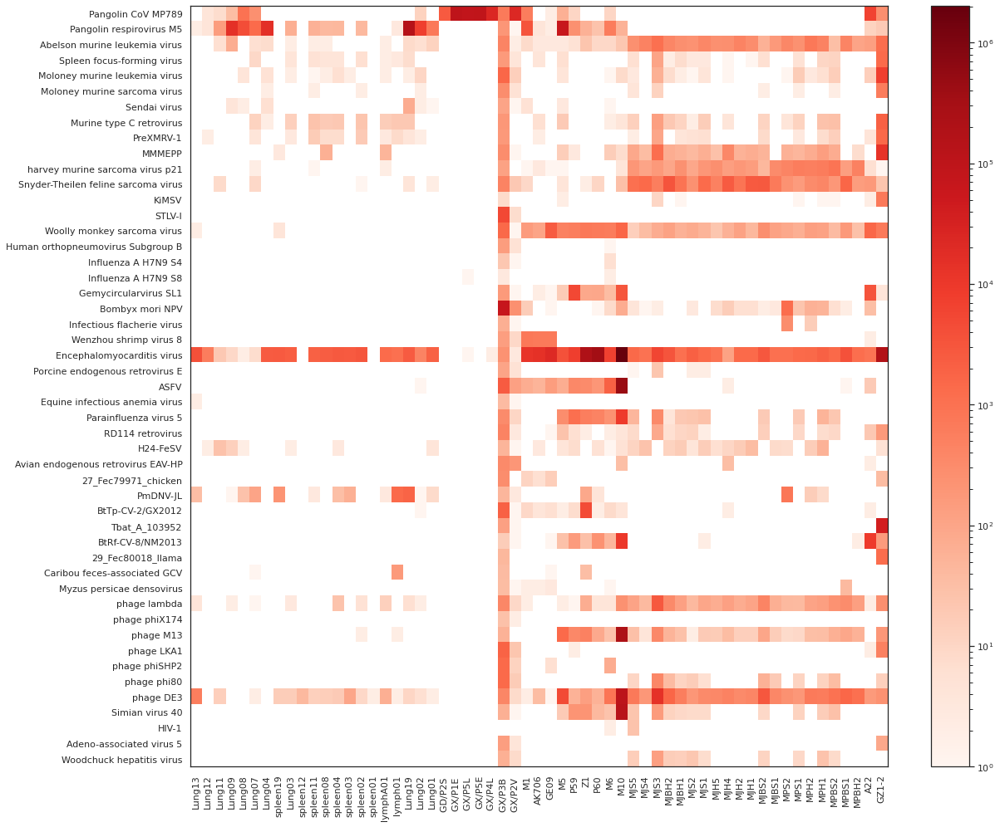

In [1171]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,14))
img=ax.imshow(plot_data, cmap=plt.cm.get_cmap("Reds"), interpolation="nearest", aspect='auto',norm=matplotlib.colors.LogNorm())
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_49_viruses_coded_counts_log_scale_{PARAMS}_T.png", bbox_inches='tight')

## Coverage

In [1172]:
df_cov=df_all.pivot(index='SRA', columns='Virus', values='Coverage%')
order_by=df_accessions['Accession'].tolist()

In [1173]:
cols=df_cov.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)
df_cov=df_cov.reindex(columns= reorder_cols)

In [1174]:
df_cov=df_cov.T
data_cov=df_cov.to_numpy()
plot_data_cov = np.ma.masked_equal(data_cov[:,:], 0)


y_labels=df_pivot.index.tolist()
x_labels=list(df_pivot.columns.values)
y_names=get_accessions(y_labels, df_accessions)
x_codes=get_samples(x_labels, df_datasets)

In [1175]:
#x_labels=list(df_cov.columns.values)
#x_codes=get_accessions(x_labels, df_accessions)
#y_labels=df_cov.index.tolist()
#y_names=get_samples(y_labels, df_datasets)

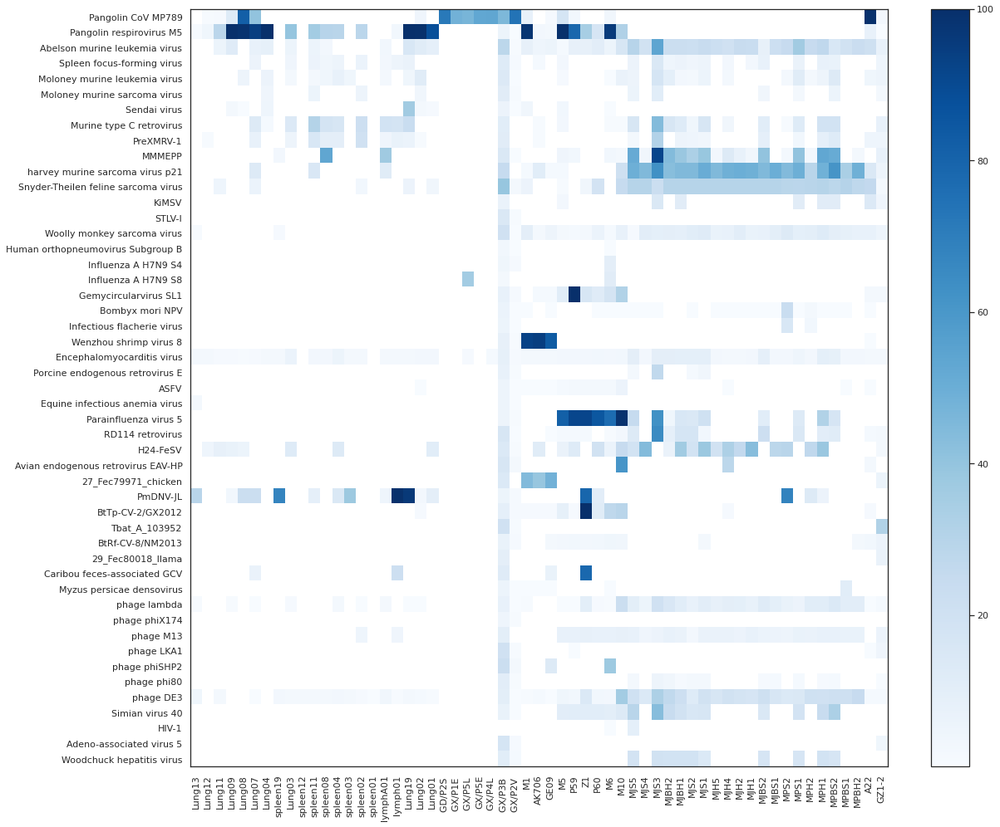

In [1176]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,14))
img=ax.imshow(plot_data_cov, cmap=plt.cm.get_cmap("Blues"), interpolation="nearest", aspect='auto')
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_49_viruses_coded_pct_cov_linear_scale_{PARAMS}_T.png", bbox_inches='tight')

## Box plots

In [1177]:
df_corr=df_pivot.T.copy()
meds = df_corr.median()
meds.sort_values(ascending=False, inplace=True)
df_corr = df_corr[meds.index]



#y_labels=df_corr.index.tolist()
#x_labels=list(df_corr.columns.values)
#y_names=get_accessions(y_labels, df_accessions)
#x_codes=get_samples(x_labels, df_datasets)

x_labels=list(df_corr.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_corr.index.tolist()
y_names=get_samples(y_labels, df_datasets)

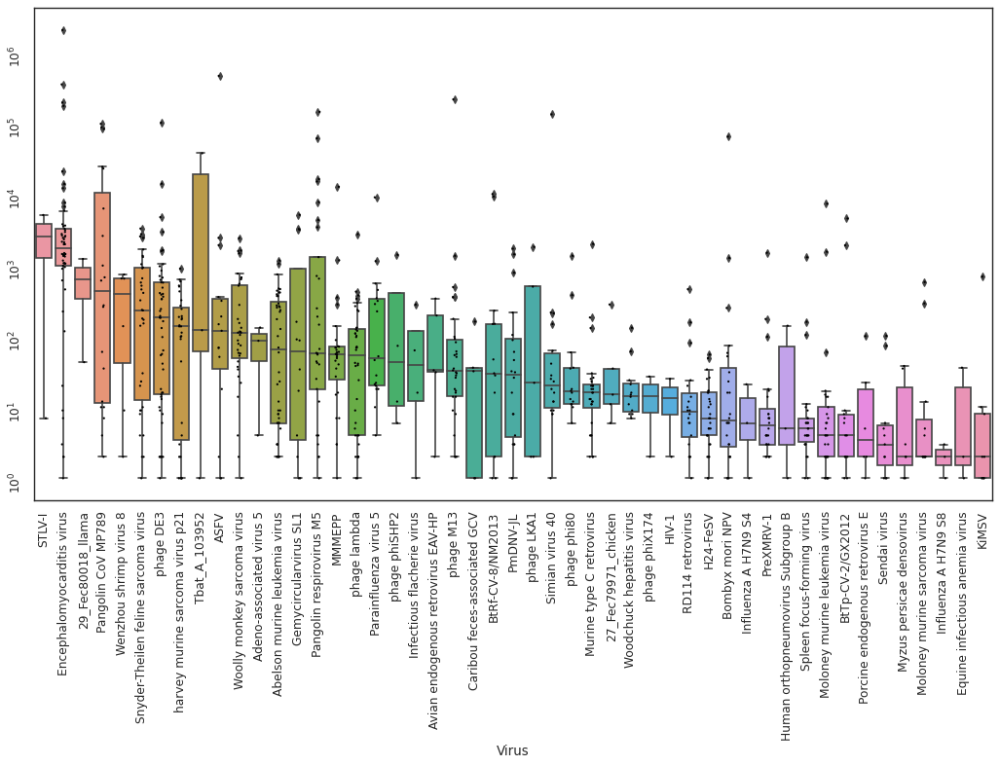

In [1178]:
# Draw Plot
#plt.figure(figsize=(13,10), dpi= 200)

fig, ax = plt.subplots(1,1, figsize=(13,10), dpi= 80)
sns.boxplot(data=df_corr)
sns.stripplot(data=df_corr, color='black', size=2, jitter=1)
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.tick_params(which='major', labelrotation=90)
ax.set_yscale("log") 
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_49_viruses_coded_box_plot_log_scale_{PARAMS}_sorted.png", bbox_inches='tight')

### percent box

In [1179]:
#df_co=df_cov.copy()

df_co=df_cov.T.copy()
meds = df_co.median()
meds.sort_values(ascending=False, inplace=True)
df_co = df_co[meds.index]
#sra_x_codes=y_codes.copy()
#sra_x_codes.insert(0,'SRA')
#df_coded.columns=sra_x_codes

In [1180]:
x_labels=list(df_co.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_co.index.tolist()
y_names=get_samples(y_labels, df_datasets)

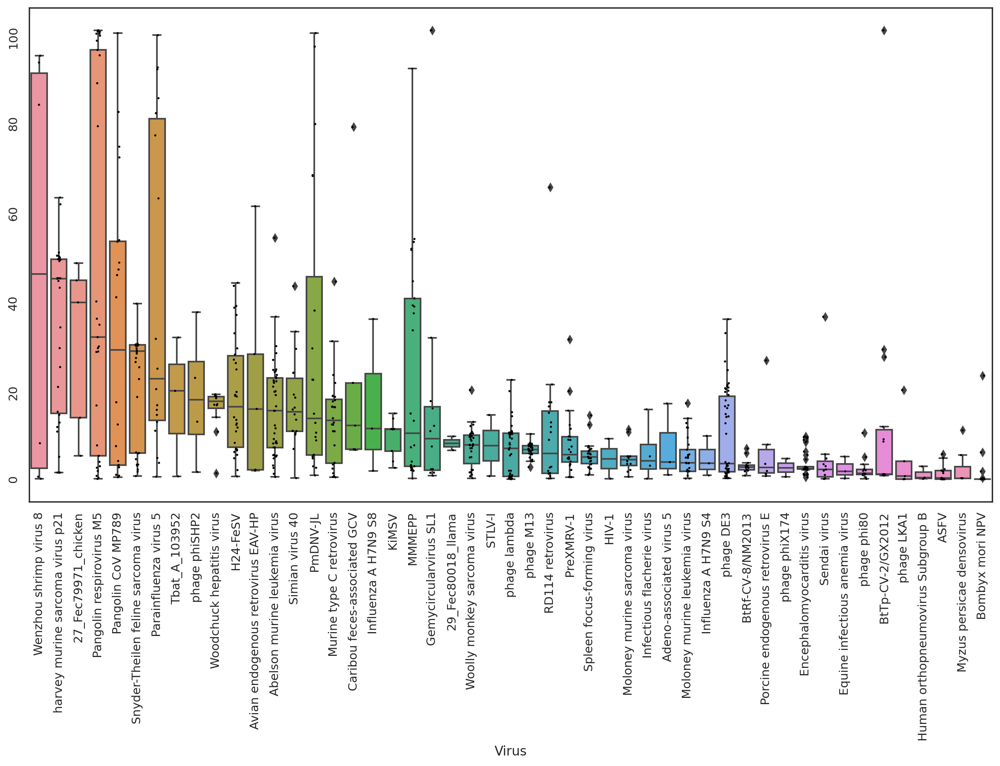

In [1181]:
fig, ax = plt.subplots(1,1, figsize=(13,10), dpi= 200)
sns.boxplot(data=df_co)
sns.stripplot(data=df_co, color='black', size=2, jitter=1)
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.tick_params(which='major', labelrotation=90)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_49_viruses_coded_box_plot_pct_cov_linear_scale_{PARAMS}_sorted.png", bbox_inches='tight')

### Difference and 10% cutoff filter

In [1019]:
df_all.columns

Index(['Virus', 'ref_length', 'N', 'DATA(%)', 'Avg depth', 'Median',
       'Coverage%', 'Cov 4x %', 'Cov 10x %', 'Cov 30x %', 'Cov 100x %', 'SRA',
       'BioProject'],
      dtype='object')

In [1020]:
#NC_038500.1: BtRf-CV-8/NM2013
print(df_all['Coverage%'].where(df_all['Virus']=='NC_038500.1').max())
df_all.loc[(df_all['Coverage%'] == 6.86) & (df_all['Virus'] =='NC_038500.1')]

6.86


,Virus,ref_length,N,DATA(%),Avg depth,Median,Coverage%,Cov 4x %,Cov 10x %,Cov 30x %,Cov 100x %,SRA,BioProject
5,NC_038500.1,1998,16,0.02,0.12,0.0,6.86,0.75,0.0,0.0,0.0,SRR11093270,PRJNA606875


In [1021]:
#'NC_001450.1': Equine infectious anemia virus
df_all['Coverage%'].where(df_all['Virus']=='NC_001450.1').max()
df_all.loc[(df_all['Coverage%'] == 5.08) & (df_all['Virus'] =='NC_001450.1')]

,Virus,ref_length,N,DATA(%),Avg depth,Median,Coverage%,Cov 4x %,Cov 10x %,Cov 30x %,Cov 100x %,SRA,BioProject
3,NC_001450.1,8359,36,0.03,0.06,0.0,5.08,0.14,0.0,0.0,0.0,SRR11093270,PRJNA606875


In [1022]:
#'NC_030142.1': Faeces associated gemycircularvirus 21 isolate 29_Fec80018_llama, complete sequence
df_all['Coverage%'].where(df_all['Virus']=='NC_030142.1').max()
df_all.loc[(df_all['Coverage%'] == 9.56) & (df_all['Virus'] =='NC_030142.1')]

,Virus,ref_length,N,DATA(%),Avg depth,Median,Coverage%,Cov 4x %,Cov 10x %,Cov 30x %,Cov 100x %,SRA,BioProject
16,NC_030142.1,2125,43,0.04,0.31,0.0,9.56,0.99,0.75,0.0,0.0,SRR11093270,PRJNA606875


In [1023]:
#'NC_001781.1':Human orthopneumovirus Subgroup B
print(df_all['Coverage%'].where(df_all['Virus']=='NC_001781.1').max())
df_all.loc[(df_all['Coverage%'] == 2.88) & (df_all['Virus'] =='NC_001781.1')]

2.88


,Virus,ref_length,N,DATA(%),Avg depth,Median,Coverage%,Cov 4x %,Cov 10x %,Cov 30x %,Cov 100x %,SRA,BioProject
1,NC_001781.1,15225,140,0.14,0.14,0.0,2.88,0.47,0.23,0.11,0.0,SRR11093270,PRJNA606875


In [1024]:
#NC_044948.1: ASFV
print(df_all['Coverage%'].where(df_all['Virus']=='NC_044948.1').max())
df_all.loc[(df_all['Coverage%'] == 5.63) & (df_all['Virus'] =='NC_044948.1')]

5.63


,Virus,ref_length,N,DATA(%),Avg depth,Median,Coverage%,Cov 4x %,Cov 10x %,Cov 30x %,Cov 100x %,SRA,BioProject
31,NC_044948.1,189333,460047,16.61,362.11,0.0,5.63,4.11,3.93,3.65,3.49,SRR11119767,PRJNA607174


In [1025]:
#NC_001422.1: phage phiX174
print(df_all['Coverage%'].where(df_all['Virus']=='NC_001422.1').max())
df_all.loc[(df_all['Coverage%'] == 4.61) & (df_all['Virus'] =='NC_001422.1')]

4.61


,Virus,ref_length,N,DATA(%),Avg depth,Median,Coverage%,Cov 4x %,Cov 10x %,Cov 30x %,Cov 100x %,SRA,BioProject
48,NC_001422.1,5386,27,0.03,0.09,0.0,4.61,0.91,0.0,0.0,0.0,SRR11093270,PRJNA606875


In [1026]:
#NC_026425.1: Influenza A H7N9 S4
print(df_all['Coverage%'].where(df_all['Virus']=='NC_026425.1').max())
df_all.loc[(df_all['Coverage%'] == 4.61) & (df_all['Virus'] =='NC_026425.1')]

9.67


,Virus,ref_length,N,DATA(%),Avg depth,Median,Coverage%,Cov 4x %,Cov 10x %,Cov 30x %,Cov 100x %,SRA,BioProject


In [1027]:
#NC_001479.1: Encephalomyocarditis virus
print(df_all['Coverage%'].where(df_all['Virus']=='NC_001479.1').max())
df_all.loc[(df_all['Coverage%'] == 4.61) & (df_all['Virus'] =='NC_001479.1')]

9.57


,Virus,ref_length,N,DATA(%),Avg depth,Median,Coverage%,Cov 4x %,Cov 10x %,Cov 30x %,Cov 100x %,SRA,BioProject


In [1028]:
#NC_001802.1: HIV-1
print(df_all['Coverage%'].where(df_all['Virus']=='NC_001802.1').max())
df_all.loc[(df_all['Coverage%'] == 9.03) & (df_all['Virus'] =='NC_001802.1')]

9.03


,Virus,ref_length,N,DATA(%),Avg depth,Median,Coverage%,Cov 4x %,Cov 10x %,Cov 30x %,Cov 100x %,SRA,BioProject
0,NC_001802.1,9181,25,0.63,0.41,0.0,9.03,3.85,1.38,0.0,0.0,SRR11306687,PRJNA610466


## From here only use >10% coverage and HIV-1, ASFV

In [1182]:
df_all_gt_10_pivot=df_all.pivot(index='SRA', columns='Virus', values='N')
df_all_gt_10_pivot=df_all_gt_10_pivot[df_all_gt_10_pivot.columns[df_all_gt_10_pivot.columns.isin(gt_10_asc)]]

In [1183]:
order_by=df_accessions['Accession'].tolist()
cols=df_all_gt_10_pivot.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [1184]:
df_all_gt_10_pivot=df_all_gt_10_pivot.reindex(columns= reorder_cols)

In [1185]:
#### untransposed

In [1186]:
#data=df_all_gt_10_pivot.to_numpy()
#plot_data = np.ma.masked_equal(data[:,:], 0)

In [1187]:
#x_labels=list(df_all_gt_10_pivot.columns.values)
#x_codes=get_accessions(x_labels, df_accessions)
#y_labels=df_all_gt_10_pivot.index.tolist()
#y_names=get_samples(y_labels, df_datasets)

In [1188]:
#### transposed

In [1189]:
df_all_gt_10_pivot=df_all_gt_10_pivot.T
data=df_all_gt_10_pivot.to_numpy()
plot_data = np.ma.masked_equal(data[:,:], 0)

x_labels=list(df_all_gt_10_pivot.columns.values)
x_codes=get_samples(x_labels, df_datasets)

y_labels=df_all_gt_10_pivot.index.tolist()
y_names=get_accessions(y_labels, df_accessions)


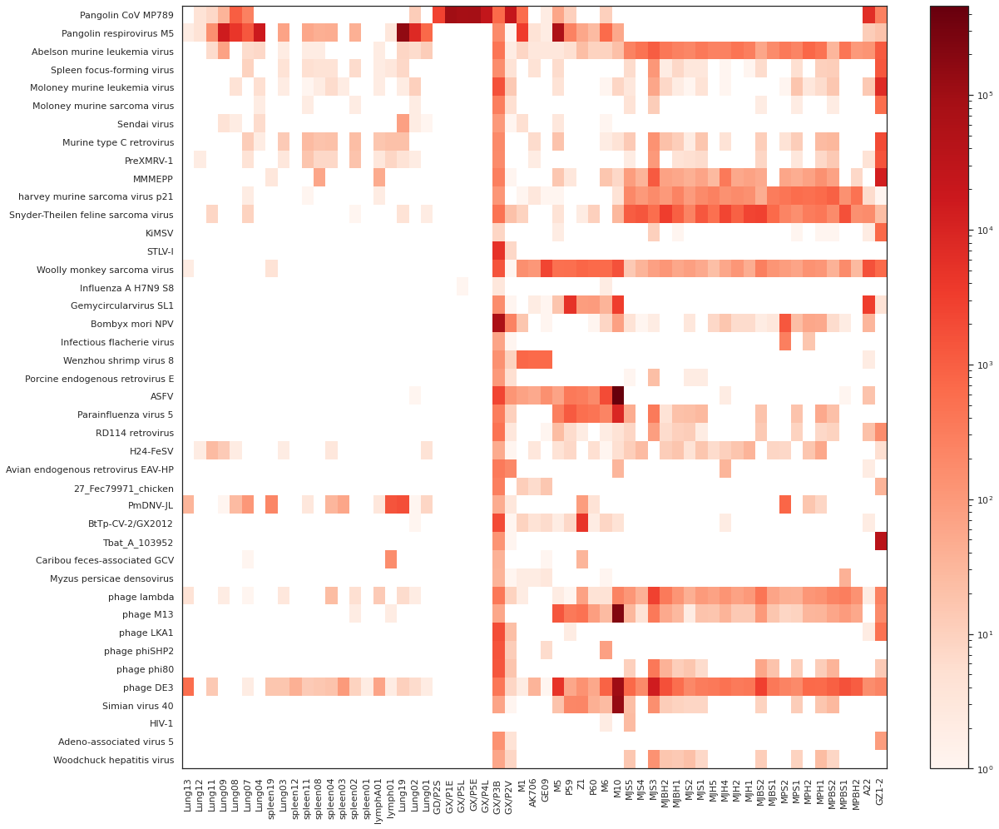

In [1190]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,14))
img=ax.imshow(plot_data, cmap=plt.cm.get_cmap("Reds"), interpolation="nearest", aspect='auto',norm=matplotlib.colors.LogNorm())
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_49_viruses_coded_counts_log_scale_{PARAMS}_gt_10pct_rotated.png", bbox_inches='tight')

## Coverage

In [1191]:
df_cov=df_all.pivot(index='SRA', columns='Virus', values='Coverage%')
df_cov=df_cov[df_cov.columns[df_cov.columns.isin(gt_10_asc)]]

order_by=df_accessions['Accession'].tolist()

In [1192]:
cols=df_cov.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)
df_cov=df_cov.reindex(columns= reorder_cols)

In [1193]:
### untransposed

In [1194]:
#data_cov=df_cov.to_numpy()
#plot_data_cov = np.ma.masked_equal(data_cov[:,:], 0)

In [1195]:
#x_labels=list(df_cov.columns.values)
#x_codes=get_accessions(x_labels, df_accessions)
#y_labels=df_cov.index.tolist()
#y_names=get_samples(y_labels, df_datasets)

In [1196]:
#### transposed

In [1197]:
df_cov=df_cov.T
data_cov=df_cov.to_numpy()
plot_data_cov = np.ma.masked_equal(data_cov[:,:], 0)


y_labels=df_pivot.index.tolist()
x_labels=list(df_pivot.columns.values)
y_names=get_accessions(y_labels, df_accessions)
x_codes=get_samples(x_labels, df_datasets)

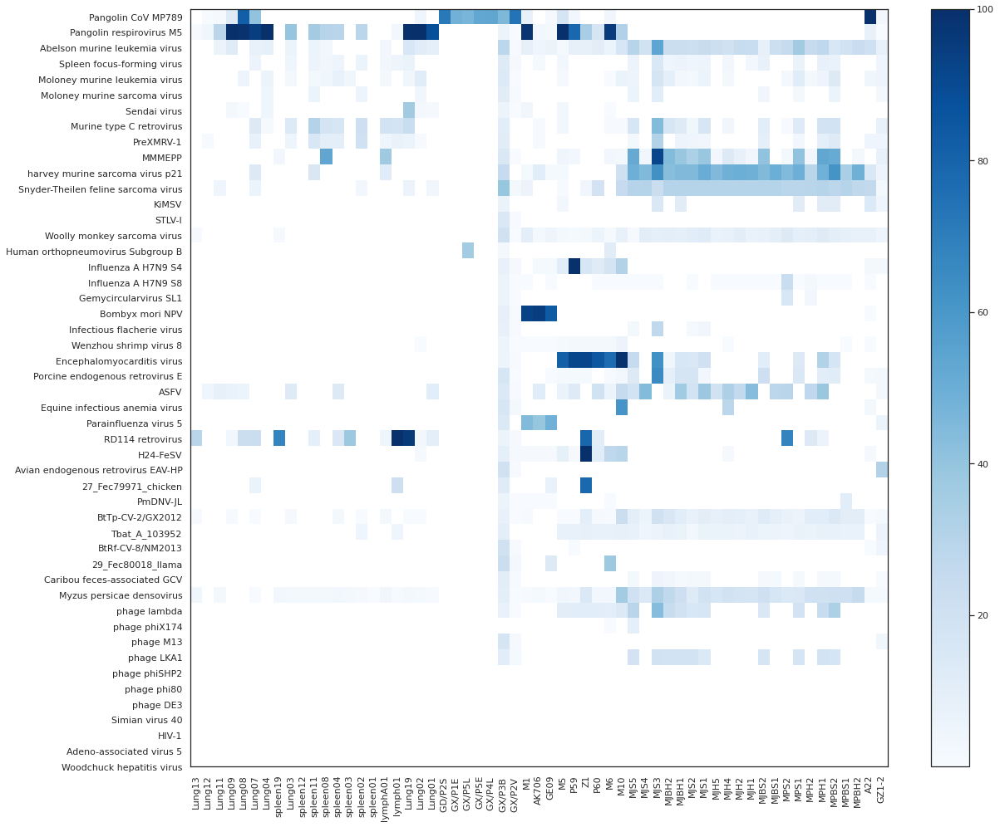

In [1198]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,14))
img=ax.imshow(plot_data_cov, cmap=plt.cm.get_cmap("Blues"), interpolation="nearest", aspect='auto')
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_49_viruses_coded_pct_cov_linear_scale_{PARAMS}_gt_10pct_rotated.png", bbox_inches='tight')

### All viruses >10% coverage, N

In [ ]:
#### median

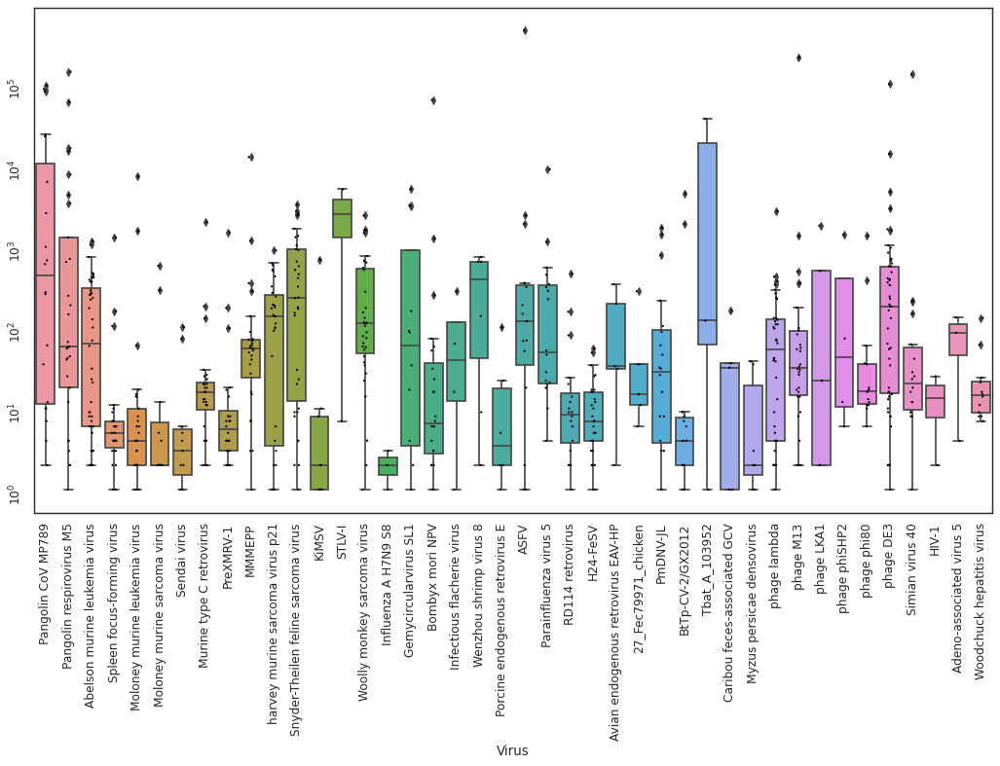

In [1040]:

#df_all_gt_10_pivot=df_all.pivot(index='SRA', columns='Virus', values='N')
#df_all_gt_10_pivot=df_all_gt_10_pivot[df_all_gt_10_pivot.columns[df_all_gt_10_pivot.columns.isin(gt_10_asc)]]


x_labels=list(df_all_gt_10_pivot.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_all_gt_10_pivot.index.tolist()
y_names=get_samples(y_labels, df_datasets)

fig, ax = plt.subplots(1,1, figsize=(13,10), dpi= 80)
sns.boxplot(data=df_all_gt_10_pivot)
sns.stripplot(data=df_all_gt_10_pivot, color='black', size=2, jitter=1)
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.tick_params(which='major', labelrotation=90)
ax.set_yscale("log") 
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_49_viruses_coded_box_plot_log_scale_{PARAMS}_gt_10pct.png", bbox_inches='tight')


In [1041]:
df_co=df_cov.copy()
#sra_x_codes=y_codes.copy()
#sra_x_codes.insert(0,'SRA')
#df_coded.columns=sra_x_codes

In [1042]:
x_labels=list(df_co.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_co.index.tolist()
y_names=get_samples(y_labels, df_datasets)

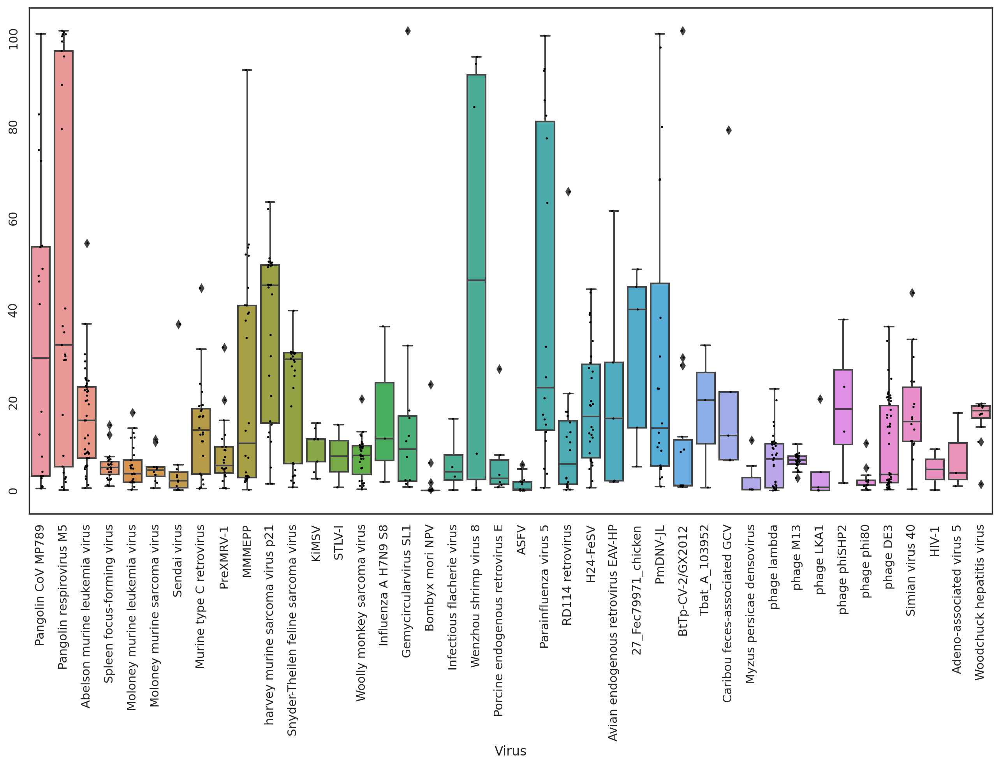

In [1043]:
fig, ax = plt.subplots(1,1, figsize=(13,10), dpi= 200)
sns.boxplot(data=df_co)
sns.stripplot(data=df_co, color='black', size=2, jitter=1)
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.tick_params(which='major', labelrotation=90)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_49_viruses_coded_box_plot_pct_cov_linear_scale_{PARAMS}_gt_10pct.png", bbox_inches='tight')

### Contigs N

In [1044]:
contigs_data_file='bamdst_MEGAHIT_28_viruses_fig2_default.csv'

In [1045]:
prjs=['PRJNA573298', 'PRJNA606875', 'PRJNA610466', 'PRJNA686836', 'PRJNA607174']
base_paths=['/mnt/1TB_0/Data/Assembly/']*(len(prjs)-1)
base_paths.append('/mnt/8TB_0/Data/Assembly/')

In [1046]:
frames=[]
for prj, base_path in zip(prjs, base_paths):
    df=get_virus_df(prj, base_path, contigs_data_file)
    frames.append(df)

In [1047]:
df_contigs=pd.concat(frames)
df_contigs.rename(columns = {'Accession':'Virus'}, inplace = True)
df_pivot_contigs=df_contigs.pivot(index='SRA', columns='Virus', values='N')

In [1048]:
order_by=df_accessions['Accession'].tolist()
cols=df_pivot_contigs.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [1049]:
df_pivot_contigs=df_pivot_contigs.reindex(columns= reorder_cols)

In [1050]:
df_pivot_contigs.columns

Index(['MT121216.1', 'MW505906.1', 'NC_001499.1', 'NC_001500.1', 'NC_001501.1',
       'NC_001502.1', 'NC_001702.1', 'NC_007815.2', 'NC_029853.1',
       'NC_038668.1', 'NC_043382.1', 'NC_009424.5', 'NC_026818.1',
       'NC_001962.1', 'NC_003781.1', 'NC_032852.1', 'NC_001479.1',
       'NC_003059.1', 'NC_044948.1', 'NC_006430.1', 'NC_009889.1',
       'NC_038923.1', 'NC_005947.1', 'NC_030141.1', 'NC_031450.1',
       'NC_038399.1', 'NC_038495.1', 'NC_024909.1', 'NC_005040.1',
       'NC_001416.1', 'NC_003287.2', 'NC_015586.1', 'NC_021190.1',
       'NC_042057.1', 'NC_001669.1', 'NC_001802.1', 'NC_004107.1'],
      dtype='object', name='Virus')

In [1051]:
x_labels=list(df_pivot_contigs.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_pivot_contigs.index.tolist()
y_names=get_samples(y_labels, df_datasets)

In [1052]:
data_contigs=df_pivot_contigs.to_numpy()

In [1053]:
plot_data = np.ma.masked_equal(data_contigs[:,:], 0)

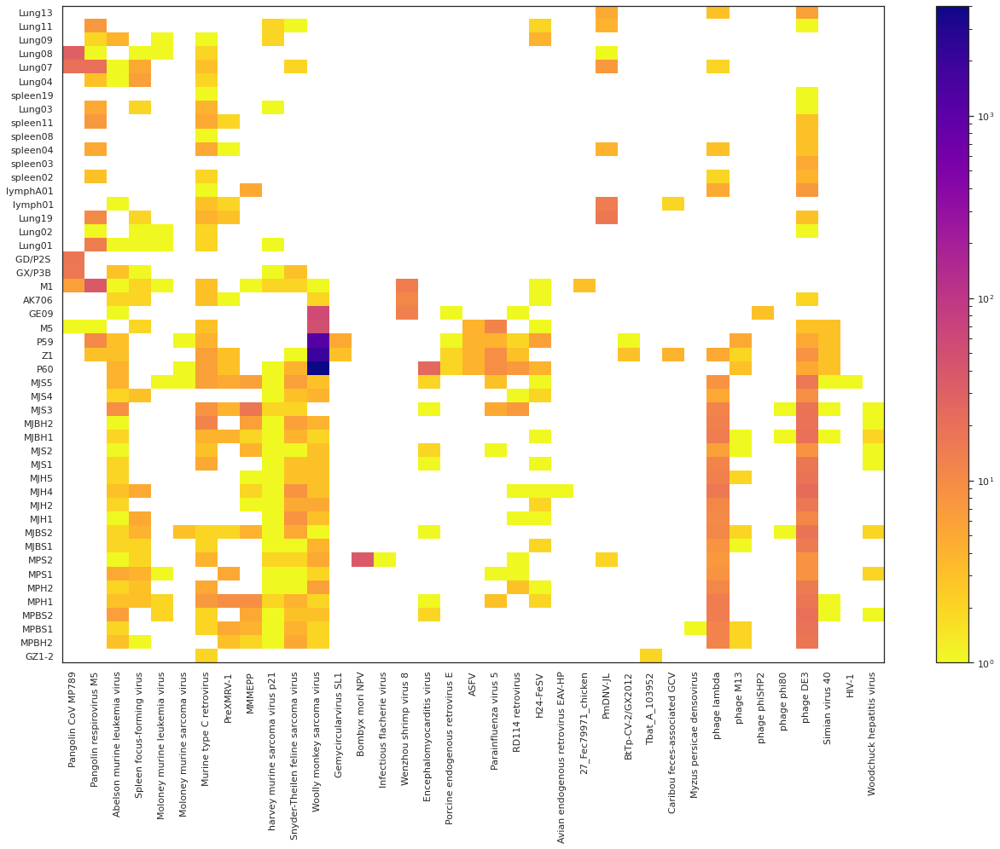

In [1054]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,14))
img=ax.imshow(plot_data, cmap=plt.cm.get_cmap("plasma_r"), interpolation="nearest", aspect='auto',norm=matplotlib.colors.LogNorm())
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_49_viruses_MEGAHIT_minimap2_default_counts_log_scale_{PARAMS}.png", bbox_inches='tight')

### Contigs coverage

In [1055]:
df_contigs=df_contigs.rename(columns=lambda x: x.strip())

In [1056]:
df_cov_contigs=df_contigs.pivot(index='SRA', columns='Virus', values='Coverage%')
order_by=df_accessions['Accession'].tolist()

In [1057]:
cols=df_cov_contigs.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)
df_cov_contigs=df_cov_contigs.reindex(columns= reorder_cols)

In [1058]:
data_cov_contigs=df_cov_contigs.to_numpy()
plot_data_cov = np.ma.masked_equal(data_cov_contigs[:,:], 0)

In [1059]:
x_labels=list(df_cov_contigs.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_cov_contigs.index.tolist()
y_names=get_samples(y_labels, df_datasets)

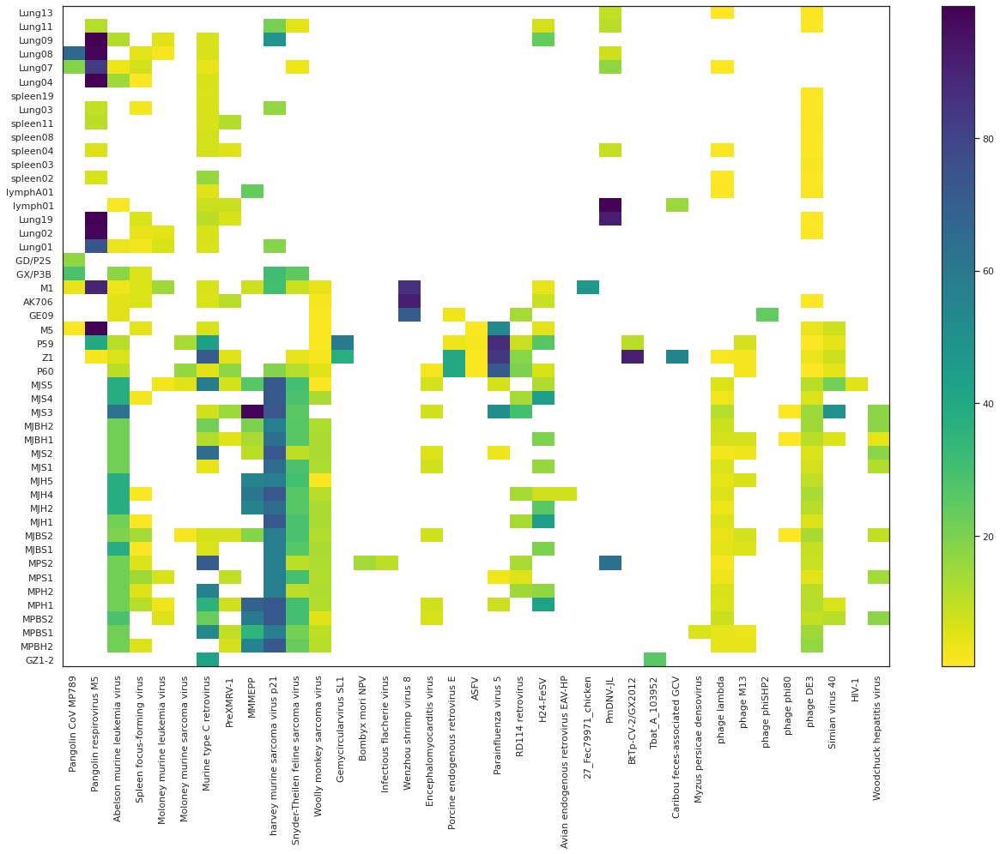

In [1060]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,14))
img=ax.imshow(plot_data_cov, cmap=plt.cm.get_cmap("viridis_r"), interpolation="nearest", aspect='auto')
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_49_viruses_MEGAHIT_minimap2_default_pct_cov_linear_scale_{PARAMS}.png", bbox_inches='tight')

## PRJNA573298

In [1061]:
df_573298=df_all[df_all['BioProject']=='PRJNA573298']

Apply 10% cutoff

In [1062]:
df_573298_gt_10 = df_573298.loc[df_573298['Coverage%'] >=10]
gt_10_asc=list(set(df_573298_gt_10['Virus'].tolist()))
#no need to add HIV-1 and ASFV
#gt_10_asc.append('NC_044948.1')
#gt_10_asc.append('NC_001802.1')

In [1063]:
df_573298_pivot=df_573298.pivot(index='SRA', columns='Virus', values='N')

In [1064]:
gt_10_asc

['NC_001499.1',
 'MT121216.1',
 'NC_029853.1',
 'NC_031450.1',
 'NC_001501.1',
 'MW505906.1',
 'NC_007815.2',
 'NC_038668.1',
 'NC_038923.1',
 'NC_024909.1',
 'NC_001702.1',
 'NC_001552.1']

In [1065]:
#keep only gt_10_asc
df_573298_pivot=df_573298_pivot[df_573298_pivot.columns[df_573298_pivot.columns.isin(gt_10_asc)]]

In [1066]:
df_573298_pivot.head()

Virus,MT121216.1,MW505906.1,NC_001499.1,NC_001501.1,NC_001552.1,NC_001702.1,NC_007815.2,NC_024909.1,NC_029853.1,NC_031450.1,NC_038668.1,NC_038923.1
SRA,,,,,,,,,,,,
SRR10168373,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,NaN,NaN
SRR10168374,4.0,4.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,2.0
SRR10168375,7.0,145.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.0
SRR10168376,35.0,15009.0,69.0,NaN,4.0,NaN,NaN,NaN,NaN,1.0,NaN,13.0
SRR10168377,984.0,4304.0,NaN,4.0,2.0,NaN,NaN,NaN,NaN,26.0,NaN,2.0


In [1067]:
order_by=df_accessions['Accession'].tolist()
cols=df_573298_pivot.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [1068]:
df_573298_pivot=df_573298_pivot.reindex(columns= reorder_cols)

In [1069]:
df_573298_n=df_573298_pivot.copy()

x_labels=list(df_573298_n.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_573298_n.index.tolist()
y_names=get_samples(y_labels, df_datasets)

### percent box

In [1070]:
df_573298_pivot_pct=df_573298.pivot(index='SRA', columns='Virus', values='Coverage%')
#keep only gt_10_asc
df_573298_pivot_pct=df_573298_pivot_pct[df_573298_pivot_pct.columns[df_573298_pivot_pct.columns.isin(gt_10_asc)]]

In [1071]:
order_by=df_accessions['Accession'].tolist()
cols=df_573298_pivot_pct.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [1072]:
df_573298_pivot_pct=df_573298_pivot_pct.reindex(columns= reorder_cols)

In [1073]:
x_labels=list(df_573298_pivot_pct.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_573298_pivot_pct.index.tolist()
y_names=get_samples(y_labels, df_datasets)

Side by side plot

/tmp/ipykernel_1456790/1611614214.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(ax1.get_yticks(), size = 15)


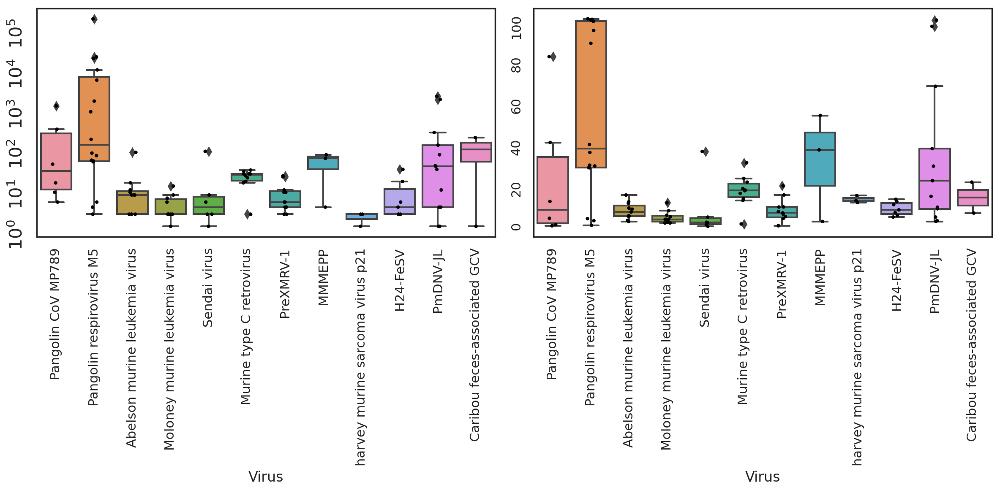

In [1074]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,6), dpi= 200)
sns.boxplot(data=df_573298_n, ax=ax1)
sns.set_style("ticks")
sns.stripplot(data=df_573298_n, color='black', size=3, jitter=1, ax=ax1)
ax1.set_xticks(list(range(len(x_codes))))
ax1.set_xticklabels(x_codes,rotation=90)
ax1.set_yticklabels(ax1.get_yticks(), size = 15)
ax1.tick_params(which='major', labelrotation=90)
ax1.set_yscale("log") 

sns.boxplot(data=df_573298_pivot_pct, ax=ax2)
sns.stripplot(data=df_573298_pivot_pct, color='black', size=3, jitter=1, ax=ax2)
ax2.set_xticks(list(range(len(x_codes))))
ax2.set_xticklabels(x_codes,rotation=90)
ax2.tick_params(which='major', labelrotation=90)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA573298_49_viruses_box_plot_N_and_pct_cov_{PARAMS}_10pct.png", bbox_inches='tight')

### Correlation matrix

In [1075]:
#df_573298_pivot = df_573298_pivot.fillna(0)
mito_summary='bamdst_reads_mitochondria_mamals_1_smL0_0_CIGAR_f100_bowtie2_summary.csv'
df_liu_lito=pd.read_csv(BASE_PATH+PRJ+'/general_plots/'+mito_summary)

In [1076]:
df_liu_lito=df_liu_lito.rename(columns=lambda x: x.strip())
df_liu_lito.set_index('SRA', inplace=True)
df_liu_lito.head()

,KY018919.1,MG196309.1,MT335859.1,NC_012920.1
SRA,,,,
SRR10168373,7.0,1354262.0,2741.0,91.0
SRR10168374,0.0,16567.0,7.0,213.0
SRR10168375,0.0,292504.0,185.0,9.0
SRR10168376,0.0,6276.0,2.0,28.0
SRR10168377,120.0,3482.0,0.0,590.0


In [1077]:
df_573298_pivot_na = df_573298_pivot.loc[:, df_573298_pivot.any()]

In [1078]:
df_573298_pivot_na.head()

Virus,MT121216.1,MW505906.1,NC_001499.1,NC_001501.1,NC_001552.1,NC_001702.1,NC_007815.2,NC_029853.1,NC_038668.1,NC_038923.1,NC_031450.1,NC_024909.1
SRA,,,,,,,,,,,,
SRR10168373,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,NaN
SRR10168374,4.0,4.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,2.0,NaN,NaN
SRR10168375,7.0,145.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,26.0,NaN,NaN
SRR10168376,35.0,15009.0,69.0,NaN,4.0,NaN,NaN,NaN,NaN,13.0,1.0,NaN
SRR10168377,984.0,4304.0,NaN,4.0,2.0,NaN,NaN,NaN,NaN,2.0,26.0,NaN


In [1079]:
df_573298_pivot_na=pd.concat([df_573298_pivot_na,df_liu_lito], axis=1)

In [1080]:
df_bac=pd.read_csv(BASE_PATH+'PRJNA573298/general_plots/All_Bacteria_STAT_pct.csv')
df_bac.drop('BioProject', axis=1, inplace=True)
df_bac.set_index('SRA', inplace=True)
df_573298_pivot_na=pd.concat([df_573298_pivot_na,df_bac], axis=1)

In [1081]:
df_573298_pivot_na.head()

,MT121216.1,MW505906.1,NC_001499.1,NC_001501.1,NC_001552.1,NC_001702.1,NC_007815.2,NC_029853.1,NC_038668.1,NC_038923.1,NC_031450.1,NC_024909.1,KY018919.1,MG196309.1,MT335859.1,NC_012920.1,Bacteria
SRA,,,,,,,,,,,,,,,,,
SRR10168373,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,NaN,7.0,1354262.0,2741.0,91.0,7.6
SRR10168374,4.0,4.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,2.0,NaN,NaN,0.0,16567.0,7.0,213.0,0.9
SRR10168375,7.0,145.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,26.0,NaN,NaN,0.0,292504.0,185.0,9.0,22.0
SRR10168376,35.0,15009.0,69.0,NaN,4.0,NaN,NaN,NaN,NaN,13.0,1.0,NaN,0.0,6276.0,2.0,28.0,21.0
SRR10168377,984.0,4304.0,NaN,4.0,2.0,NaN,NaN,NaN,NaN,2.0,26.0,NaN,120.0,3482.0,0.0,590.0,13.0


In [1082]:
# 	Accession 	Code 	Description 	Host 	Virus_matrix_plot 	Common vector component/Phage
df_mito_accessions=df_accessions.copy()

In [1083]:
df_mito_accessions.loc[len(df_mito_accessions.index)] = ['KY018919.1', 'Mus musculus', '', '','','']
df_mito_accessions.loc[len(df_mito_accessions.index)] = ['MG196309.1', 'Manis javanica', '', '','','']
df_mito_accessions.loc[len(df_mito_accessions.index)] = ['MT335859.1', 'Manis pentadactyla', '', '','','']
df_mito_accessions.loc[len(df_mito_accessions.index)] = ['NC_012920.1', 'Homo sapiens', '', '','','']
df_mito_accessions.loc[len(df_mito_accessions.index)] = ['Bacteria', 'Bacteria', '', '','','']

In [1084]:
x_labels=list(df_573298_pivot_na.columns.values)
x_codes=get_accessions(x_labels, df_mito_accessions)


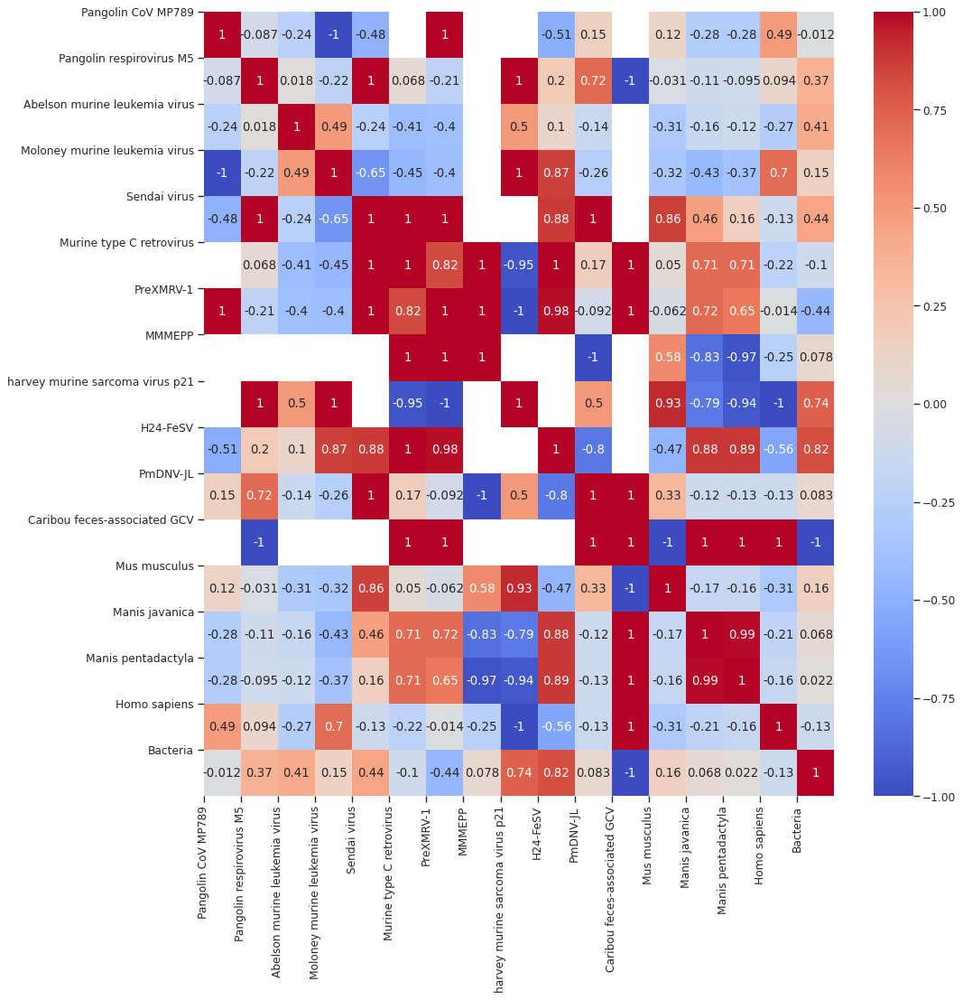

In [1085]:
fig, ax = plt.subplots(1,1, figsize=(14, 14), dpi= 80)
#sns.set(rc={"figure.figsize":(19, 19)})
sns_plot=sns.heatmap(df_573298_pivot_na.corr(method='pearson'),annot=True, cmap='coolwarm')
fig = sns_plot.get_figure()

ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(x_codes))))
ax.set_yticklabels(x_codes)
#ax.tick_params(which='major', labelrotation=90)

fig.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_viruses_pearson_count_PRJNA573298_{PARAMS}_10cpt_mito.png")

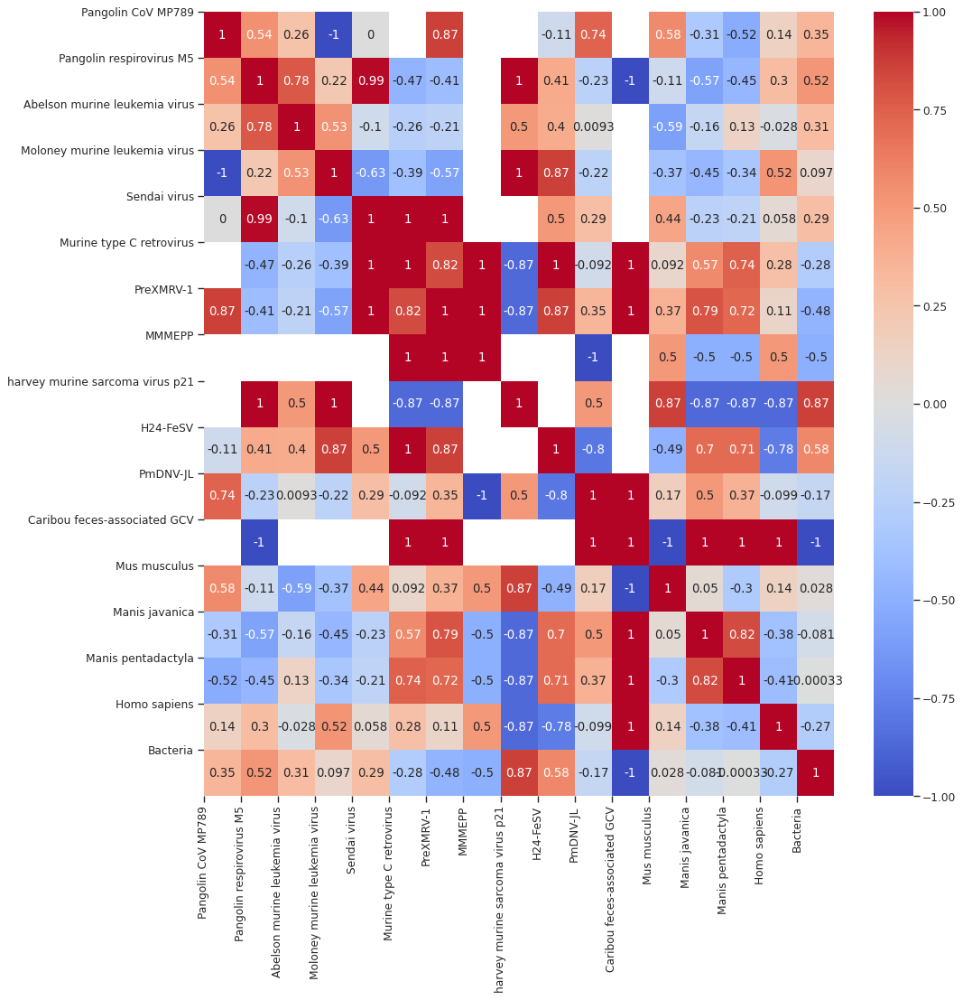

In [1086]:
fig, ax = plt.subplots(1,1, figsize=(14, 14), dpi= 80)
#sns.set(rc={"figure.figsize":(19, 19)})
sns_plot=sns.heatmap(df_573298_pivot_na.corr(method='spearman'),annot=True, cmap='coolwarm')
fig = sns_plot.get_figure()

ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(x_codes))))
ax.set_yticklabels(x_codes)
#ax.tick_params(which='major', labelrotation=90)

fig.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_viruses_spearman_count_PRJNA573298_{PARAMS}_10cpt_mito.png")

### percent

In [1087]:
df_573298_pivot=df_573298.pivot(index='SRA', columns='Virus', values='Coverage%')

In [1088]:
order_by=df_accessions['Accession'].tolist()
cols=df_573298_pivot.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [1089]:
df_573298_pivot=df_573298_pivot.reindex(columns= reorder_cols)

In [1090]:
df_573298_pivot = df_573298_pivot.fillna(0)

In [1091]:
df_573298_pivot = df_573298_pivot.loc[:, df_573298_pivot.any()]

In [1092]:
df_573298_pivot.head()

Virus,MT121216.1,MW505906.1,NC_001499.1,NC_001500.1,NC_001501.1,NC_001502.1,NC_001552.1,NC_001702.1,NC_007815.2,NC_029853.1,...,NC_001479.1,NC_044948.1,NC_001450.1,NC_038923.1,NC_031450.1,NC_038399.1,NC_024909.1,NC_001416.1,NC_003287.2,NC_042057.1
SRA,,,,,,,,,,,,,,,,,,,,,
SRR10168373,0.00,0.77,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,...,2.32,0.0,1.79,0.00,29.16,0.0,0.0,0.73,0.0,3.83
SRR10168374,0.47,3.90,0.00,0.0,0.00,0.0,0.00,0.0,0.48,0.0,...,2.32,0.0,0.00,4.69,0.00,0.0,0.0,0.00,0.0,0.00
SRR10168375,1.01,28.46,5.38,0.0,0.00,0.0,0.00,0.0,0.00,0.0,...,1.05,0.0,0.00,8.13,0.00,0.0,0.0,0.00,0.0,1.79
SRR10168376,12.21,99.77,12.01,0.0,0.00,0.0,2.19,0.0,0.00,0.0,...,1.17,0.0,0.00,6.84,2.90,0.0,0.0,0.62,0.0,0.00
SRR10168377,81.81,98.79,0.00,0.0,4.83,0.0,0.23,0.0,0.00,0.0,...,0.46,0.0,0.00,5.46,22.15,0.0,0.0,0.00,0.0,0.00


In [1093]:
x_labels=list(df_573298_pivot.columns.values)
x_codes=get_accessions(x_labels, df_accessions)


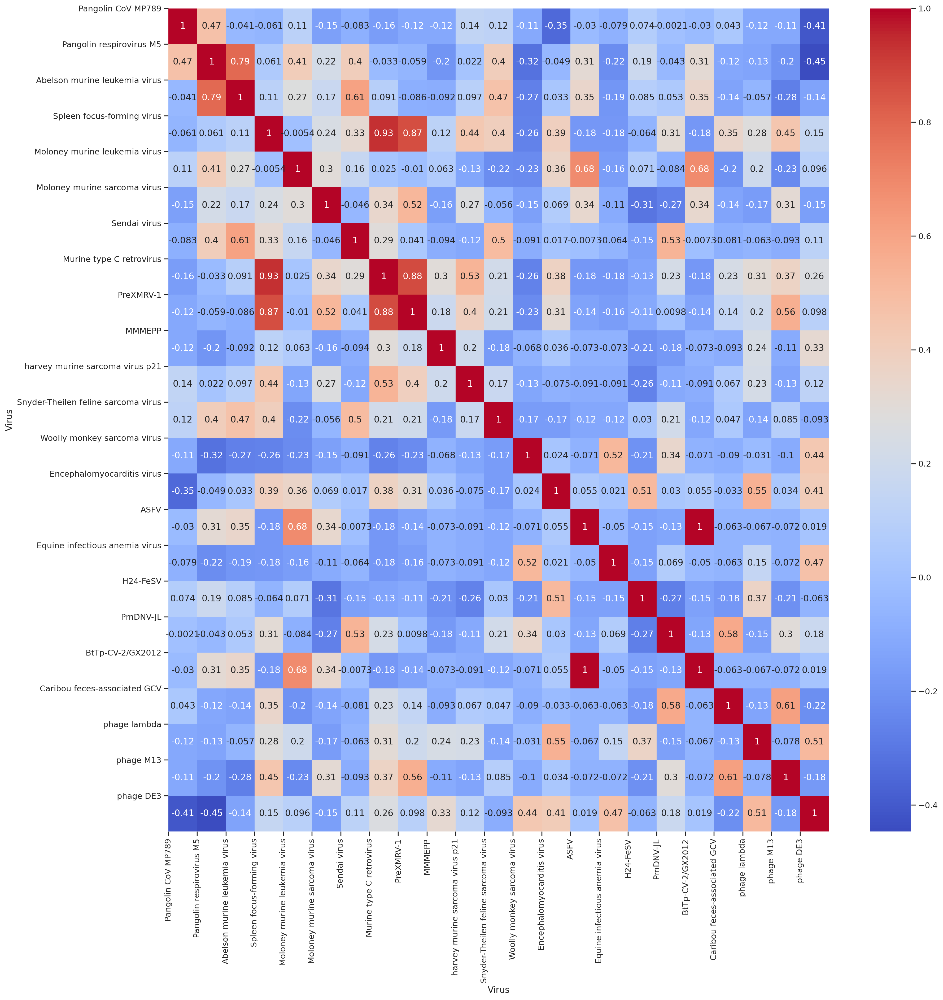

In [1094]:
fig, ax = plt.subplots(1,1, figsize=(19, 19), dpi= 200)
#sns.set(rc={"figure.figsize":(19, 19)})
sns_plot=sns.heatmap(df_573298_pivot.corr(method='pearson'),annot=True, cmap='coolwarm')
fig = sns_plot.get_figure()

ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(x_codes))))
ax.set_yticklabels(x_codes)
#ax.tick_params(which='major', labelrotation=90)

fig.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_viruses_pearson_percent_coverage_PRJNA573298_{PARAMS}.png")

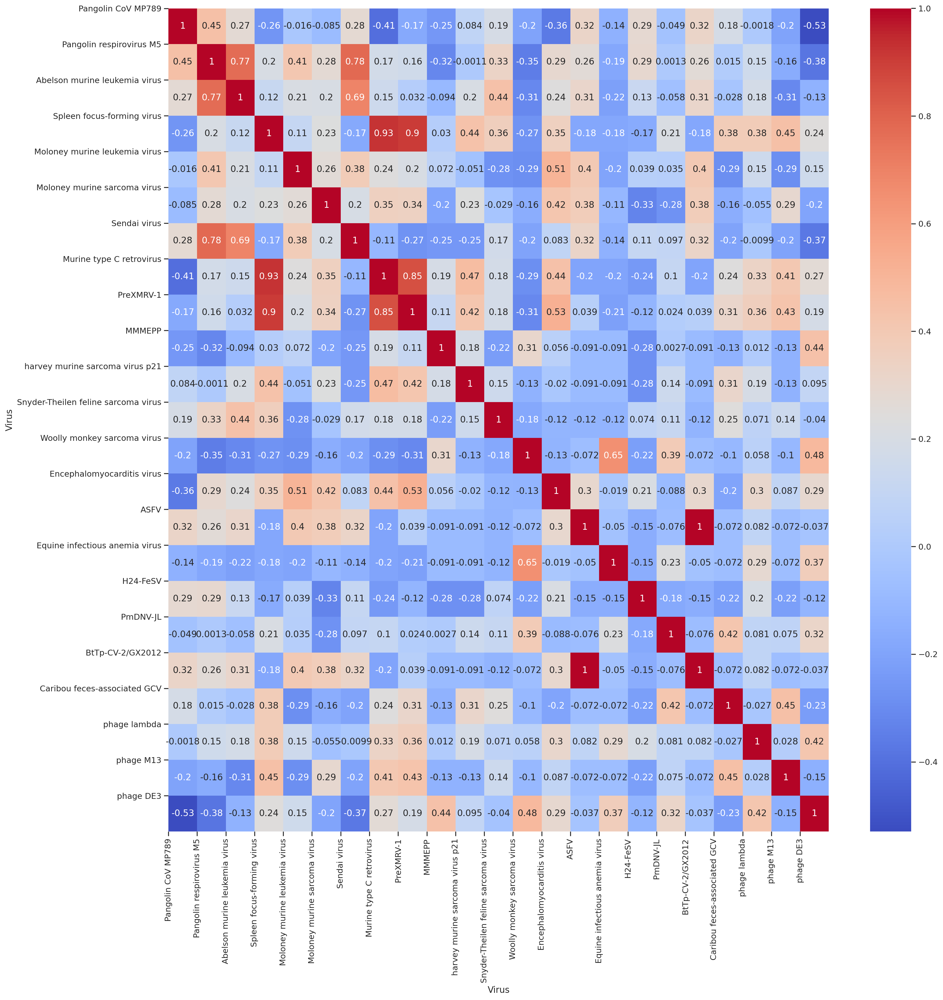

In [1095]:
fig, ax = plt.subplots(1,1, figsize=(19, 19), dpi= 200)
#sns.set(rc={"figure.figsize":(19, 19)})
sns_plot=sns.heatmap(df_573298_pivot.corr(method='spearman'),annot=True, cmap='coolwarm')
fig = sns_plot.get_figure()

ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(x_codes))))
ax.set_yticklabels(x_codes)
#ax.tick_params(which='major', labelrotation=90)

fig.tight_layout()
fig.savefig(PLOT_PATH+f"Pangolin_SRA_viruses_spearman_percent_coverage_PRJNA573298_{PARAMS}.png")

In [1096]:
df_573298_pivot.shape

(21, 23)

In [1097]:
df_573298_pivot.head()

Virus,MT121216.1,MW505906.1,NC_001499.1,NC_001500.1,NC_001501.1,NC_001502.1,NC_001552.1,NC_001702.1,NC_007815.2,NC_029853.1,...,NC_001479.1,NC_044948.1,NC_001450.1,NC_038923.1,NC_031450.1,NC_038399.1,NC_024909.1,NC_001416.1,NC_003287.2,NC_042057.1
SRA,,,,,,,,,,,,,,,,,,,,,
SRR10168373,0.00,0.77,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,...,2.32,0.0,1.79,0.00,29.16,0.0,0.0,0.73,0.0,3.83
SRR10168374,0.47,3.90,0.00,0.0,0.00,0.0,0.00,0.0,0.48,0.0,...,2.32,0.0,0.00,4.69,0.00,0.0,0.0,0.00,0.0,0.00
SRR10168375,1.01,28.46,5.38,0.0,0.00,0.0,0.00,0.0,0.00,0.0,...,1.05,0.0,0.00,8.13,0.00,0.0,0.0,0.00,0.0,1.79
SRR10168376,12.21,99.77,12.01,0.0,0.00,0.0,2.19,0.0,0.00,0.0,...,1.17,0.0,0.00,6.84,2.90,0.0,0.0,0.62,0.0,0.00
SRR10168377,81.81,98.79,0.00,0.0,4.83,0.0,0.23,0.0,0.00,0.0,...,0.46,0.0,0.00,5.46,22.15,0.0,0.0,0.00,0.0,0.00


## PRJNA606875

In [832]:
df_606875=df_all[df_all['BioProject']=='PRJNA606875']

Apply 10% cutoff

In [833]:
df_606875_gt_10 = df_606875.loc[df_606875['Coverage%'] >=10]
gt_10_asc=list(set(df_606875_gt_10['Virus'].tolist()))
#add HIV-1 and ASFV
gt_10_asc.append('NC_044948.1')
gt_10_asc.append('NC_001802.1')

In [834]:
df_606875_pivot=df_606875.pivot(index='SRA', columns='Virus', values='N')

In [835]:
#keep only gt_10_asc
df_606875_pivot=df_606875_pivot[df_606875_pivot.columns[df_606875_pivot.columns.isin(gt_10_asc)]]

In [836]:
df_606875_pivot.head()

Virus,MT121216.1,NC_000858.1,NC_001499.1,NC_001500.1,NC_001501.1,NC_001502.1,NC_001702.1,NC_003287.2,NC_004107.1,NC_005947.1,...,NC_024909.1,NC_026428.1,NC_029853.1,NC_030141.1,NC_038495.1,NC_038668.1,NC_038923.1,NC_042057.1,NC_043382.1,NC_044948.1
SRA,,,,,,,,,,,,,,,,,,,,,
SRR11093265,2572.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SRR11093266,97285.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SRR11093267,82337.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SRR11093268,87166.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SRR11093269,24079.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [837]:
order_by=df_accessions['Accession'].tolist()
cols=df_606875_pivot.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [838]:
df_606875_pivot=df_606875_pivot.reindex(columns= reorder_cols)

In [839]:
df_606875_n=df_606875_pivot.copy()

x_labels=list(df_606875_n.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_606875_n.index.tolist()
y_names=get_samples(y_labels, df_datasets)

### percent box

In [840]:
df_606875_pivot_pct=df_606875.pivot(index='SRA', columns='Virus', values='Coverage%')
#keep only gt_10_asc
df_606875_pivot_pct=df_606875_pivot_pct[df_606875_pivot_pct.columns[df_606875_pivot_pct.columns.isin(gt_10_asc)]]

In [841]:
order_by=df_accessions['Accession'].tolist()
cols=df_606875_pivot_pct.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [842]:
df_606875_pivot_pct=df_606875_pivot_pct.reindex(columns= reorder_cols)

In [843]:
x_labels=list(df_606875_pivot_pct.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_606875_pivot_pct.index.tolist()
y_names=get_samples(y_labels, df_datasets)

Side by side plot

/tmp/ipykernel_3658786/2315200566.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(ax1.get_yticks(), size = 15)


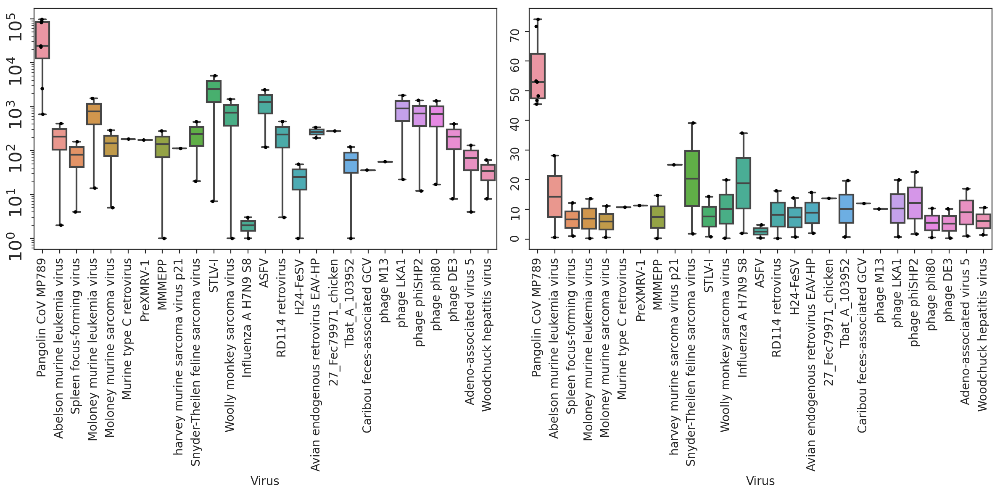

In [844]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,6), dpi= 200)
sns.boxplot(data=df_606875_n, ax=ax1)
sns.set_style("ticks")
sns.stripplot(data=df_606875_n, color='black', size=3, jitter=1, ax=ax1)
ax1.set_xticks(list(range(len(x_codes))))
ax1.set_xticklabels(x_codes,rotation=90)
ax1.set_yticklabels(ax1.get_yticks(), size = 15)
ax1.tick_params(which='major', labelrotation=90)
ax1.set_yscale("log") 

sns.boxplot(data=df_606875_pivot_pct, ax=ax2)
sns.stripplot(data=df_606875_pivot_pct, color='black', size=3, jitter=1, ax=ax2)
ax2.set_xticks(list(range(len(x_codes))))
ax2.set_xticklabels(x_codes,rotation=90)
ax2.tick_params(which='major', labelrotation=90)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA606875_49_viruses_box_plot_N_and_pct_cov_{PARAMS}.png", bbox_inches='tight')

N and Pct

In [845]:
data_606875=df_606875_pivot.to_numpy()
plot_data = np.ma.masked_equal(data_606875[:,:], 0)

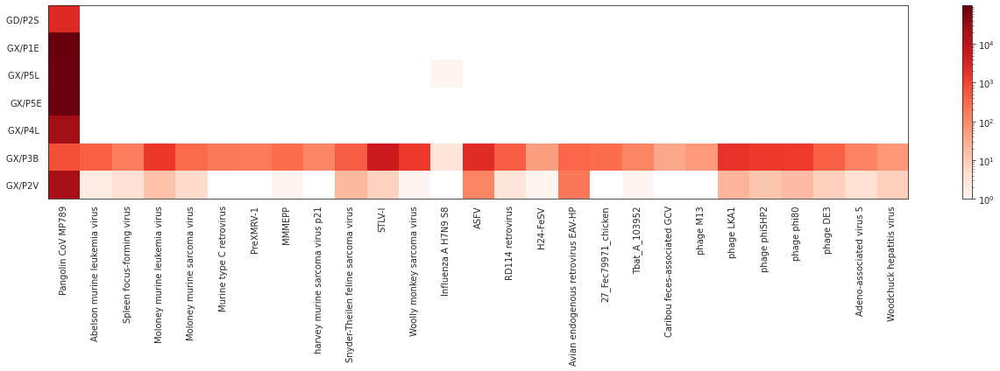

In [846]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,6))
img=ax.imshow(plot_data, cmap=plt.cm.get_cmap("Reds"), interpolation="nearest", aspect='auto',norm=matplotlib.colors.LogNorm())
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA606875_49_viruses_coded_counts_log_scale_{PARAMS}.png", bbox_inches='tight')

In [847]:
data_cov=df_606875_pivot_pct.to_numpy()
plot_data_cov = np.ma.masked_equal(data_cov[:,:], 0)

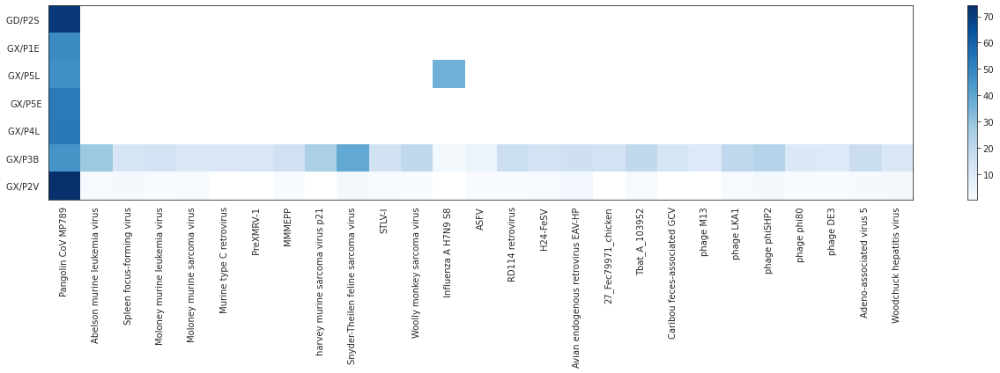

In [848]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,6))
img=ax.imshow(plot_data_cov, cmap=plt.cm.get_cmap("Blues"), interpolation="nearest", aspect='auto')
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA606875_49_viruses_coded_pct_cov_linear_scale_{PARAMS}.png", bbox_inches='tight')

## PRJNA610466

In [896]:
df_610466=df_all[df_all['BioProject']=='PRJNA610466']

Apply 10% cutoff

In [911]:
df_610466_gt_10 = df_610466.loc[df_610466['Coverage%'] >=10]
gt_10_asc=list(set(df_610466_gt_10['Virus'].tolist()))
#add HIV-1 and ASFV
gt_10_asc.append('NC_044948.1')
gt_10_asc.append('NC_001802.1')

In [912]:
df_610466_pivot=df_610466.pivot(index='SRA', columns='Virus', values='N')

In [913]:
df_610466_pivot.shape

(20, 31)

In [914]:
#keep only gt_10_asc
df_610466_pivot=df_610466_pivot[df_610466_pivot.columns[df_610466_pivot.columns.isin(gt_10_asc)]]

In [915]:
df_610466_pivot.head()

Virus,NC_001416.1,NC_001499.1,NC_001500.1,NC_001501.1,NC_001502.1,NC_001669.1,NC_001702.1,NC_001802.1,NC_001962.1,NC_003059.1,...,NC_009424.5,NC_009889.1,NC_029853.1,NC_031450.1,NC_038668.1,NC_038923.1,NC_042057.1,NC_043382.1,NC_043426.1,NC_044948.1
SRA,,,,,,,,,,,,,,,,,,,,,
SRR11306687,109.0,256.0,6.0,3.0,4.0,23.0,13.0,25.0,4.0,1.0,...,14.0,8.0,88.0,NaN,191.0,11.0,701.0,1028.0,NaN,NaN
SRR11306688,38.0,459.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,34.0,NaN,35.0,NaN,100.0,25.0,182.0,1348.0,NaN,NaN
SRR11306689,2724.0,1052.0,104.0,60.0,12.0,148.0,130.0,NaN,2.0,22.0,...,74.0,80.0,1168.0,NaN,172.0,NaN,13943.0,568.0,10.0,NaN
SRR11306690,337.0,388.0,2.0,7.0,NaN,12.0,20.0,NaN,NaN,NaN,...,112.0,6.0,69.0,NaN,98.0,12.0,1625.0,3269.0,NaN,NaN
SRR11306691,119.0,265.0,7.0,2.0,NaN,9.0,11.0,NaN,NaN,NaN,...,57.0,10.0,56.0,NaN,241.0,17.0,566.0,926.0,1.0,NaN


In [916]:
order_by=df_accessions['Accession'].tolist()
cols=df_610466_pivot.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [917]:
df_610466_pivot=df_610466_pivot.reindex(columns= reorder_cols)

In [918]:
df_610466_n=df_610466_pivot.copy()

x_labels=list(df_610466_n.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_610466_n.index.tolist()
y_names=get_samples(y_labels, df_datasets)

/tmp/ipykernel_3658786/3059343530.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), size = 15)


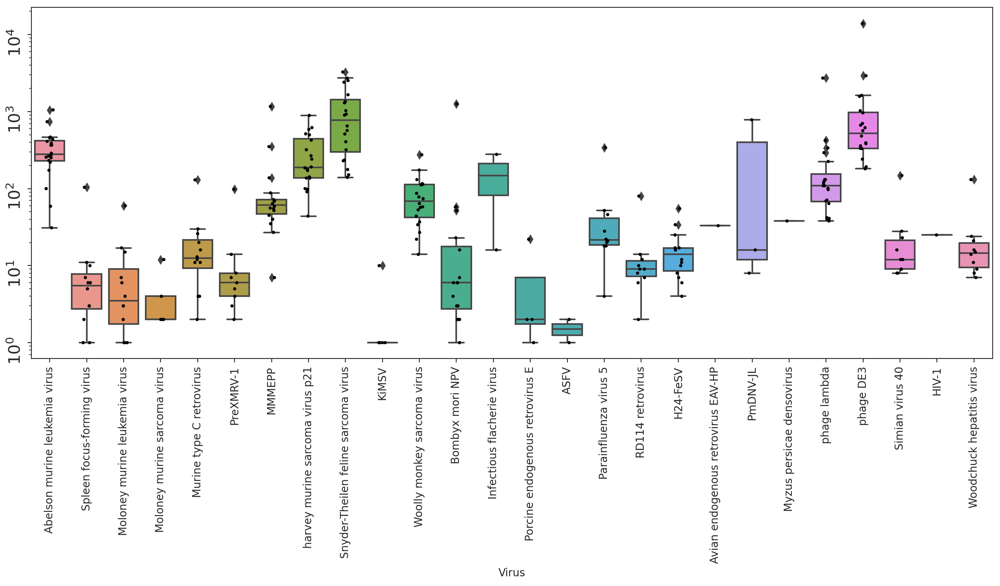

In [919]:
fig, ax = plt.subplots(figsize=(16,6), dpi= 200)
sns.boxplot(data=df_610466_n)
sns.set_style("ticks")
sns.stripplot(data=df_610466_n, color='black', size=3, jitter=1)
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticklabels(ax.get_yticks(), size = 15)
ax.tick_params(which='major', labelrotation=90)
ax.set_yscale("log") 
fig.savefig(PLOT_PATH+f"PRJNA610466_49_viruses_box_plot_N_{PARAMS}_10pct_.png", bbox_inches='tight')

### percent box

In [920]:
df_610466_pivot_pct=df_610466.pivot(index='SRA', columns='Virus', values='Coverage%')
#keep only gt_10_asc
df_610466_pivot_pct=df_610466_pivot_pct[df_610466_pivot_pct.columns[df_610466_pivot_pct.columns.isin(gt_10_asc)]]

In [921]:
order_by=df_accessions['Accession'].tolist()
cols=df_610466_pivot_pct.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [922]:
df_610466_pivot_pct=df_610466_pivot_pct.reindex(columns= reorder_cols)

In [923]:
x_labels=list(df_610466_pivot_pct.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_610466_pivot_pct.index.tolist()
y_names=get_samples(y_labels, df_datasets)

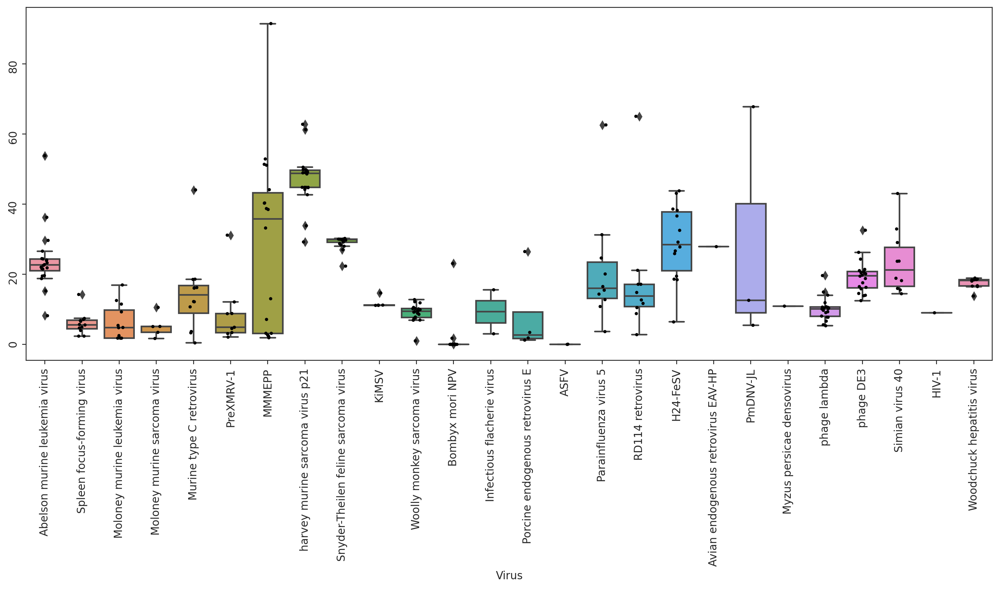

In [924]:
fig, ax = plt.subplots(figsize=(16,6), dpi= 200)
sns.boxplot(data=df_610466_pivot_pct)
sns.stripplot(data=df_610466_pivot_pct, color='black', size=3, jitter=1)
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.tick_params(which='major', labelrotation=90)
#plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA610466_49_viruses_box_plot_pct_cov_{PARAMS}_10pct_.png", bbox_inches='tight')

Side by side plot

/tmp/ipykernel_3658786/838202737.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(ax1.get_yticks(), size = 15)


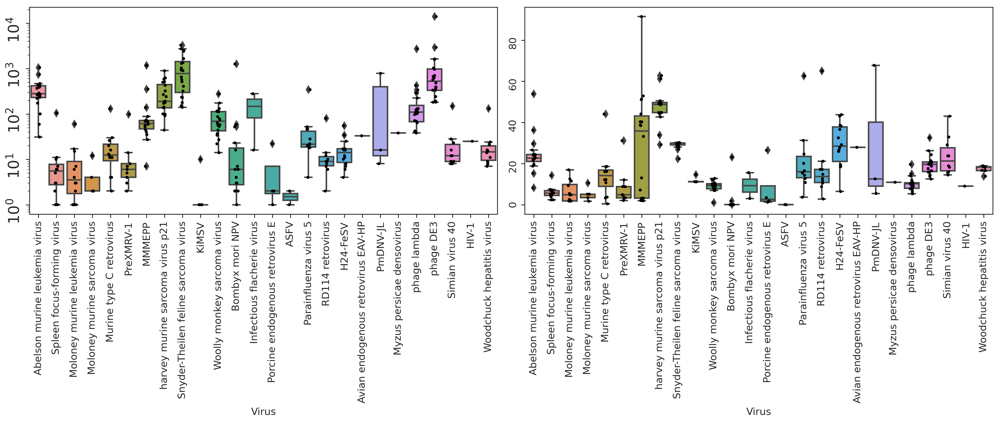

In [925]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(14,6), dpi= 300)
sns.boxplot(data=df_610466_n, ax=ax1)
sns.set_style("ticks")
sns.stripplot(data=df_610466_n, color='black', size=3, jitter=1, ax=ax1)
ax1.set_xticks(list(range(len(x_codes))))
ax1.set_xticklabels(x_codes,rotation=90)
ax1.set_yticklabels(ax1.get_yticks(), size = 15)
ax1.tick_params(which='major', labelrotation=90)
ax1.set_yscale("log") 

sns.boxplot(data=df_610466_pivot_pct, ax=ax2)
sns.stripplot(data=df_610466_pivot_pct, color='black', size=3, jitter=1, ax=ax2)
ax2.set_xticks(list(range(len(x_codes))))
ax2.set_xticklabels(x_codes,rotation=90)
ax2.tick_params(which='major', labelrotation=90)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA610466_49_viruses_box_plot_N_and_pct_cov_{PARAMS}_10pct.png", bbox_inches='tight')

In [926]:
data_610466=df_610466_pivot.to_numpy()
plot_data = np.ma.masked_equal(data_610466[:,:], 0)

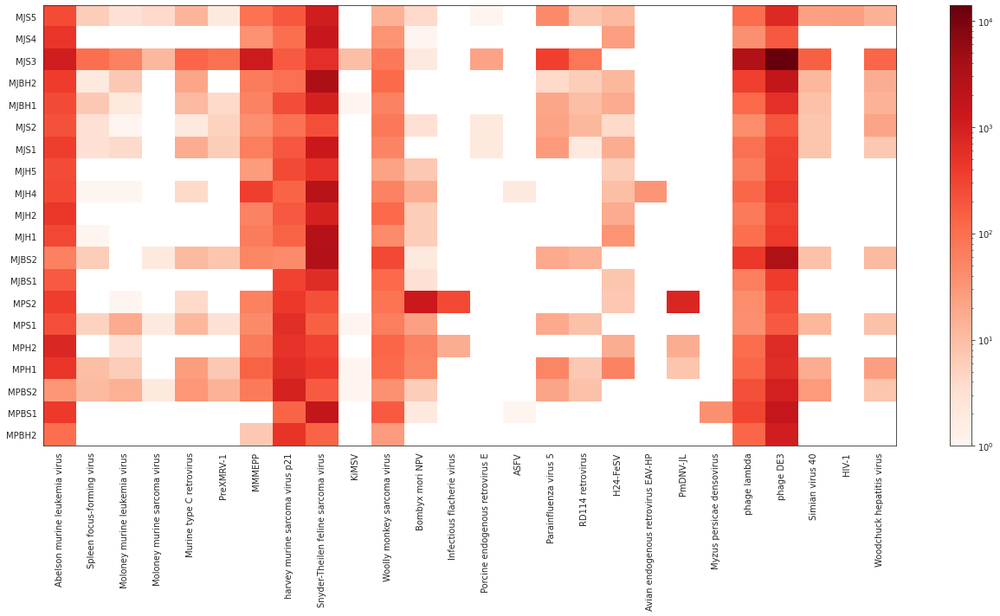

In [930]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,10))
img=ax.imshow(plot_data, cmap=plt.cm.get_cmap("Reds"), interpolation="nearest", aspect='auto',norm=matplotlib.colors.LogNorm())
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA610466_49_viruses_coded_counts_log_scale_{PARAMS}_10pct.png", bbox_inches='tight')

In [931]:
data_cov=df_610466_pivot_pct.to_numpy()
plot_data_cov = np.ma.masked_equal(data_cov[:,:], 0)

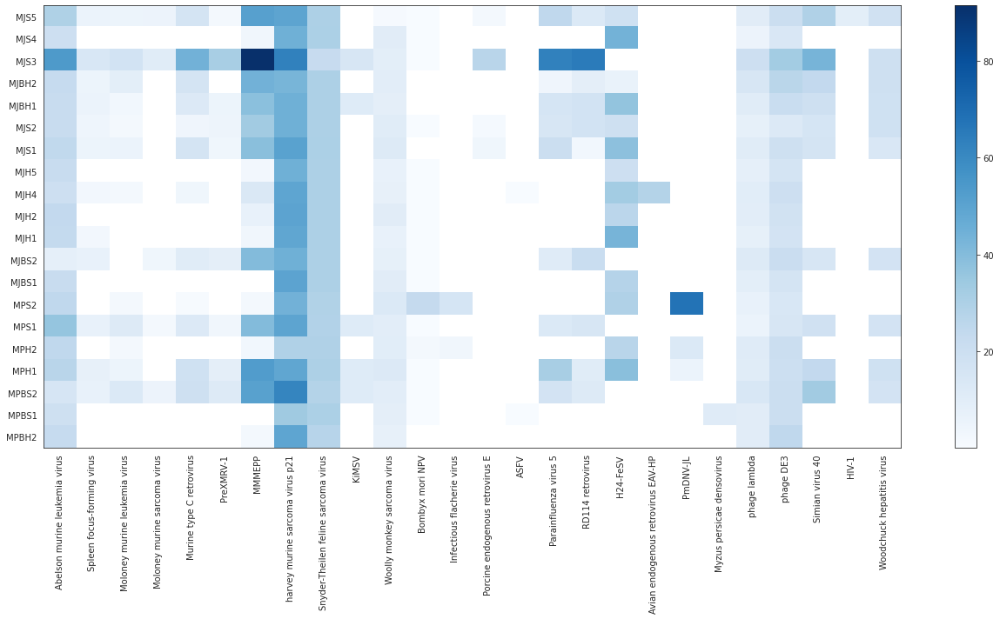

In [932]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,10))
img=ax.imshow(plot_data_cov, cmap=plt.cm.get_cmap("Blues"), interpolation="nearest", aspect='auto')
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA610466_49_viruses_coded_pct_cov_linear_scale_{PARAMS}_10pct.png", bbox_inches='tight')

## PRJNA607174

In [865]:
df_607174=df_all[df_all['BioProject']=='PRJNA607174']

Apply 10% cutoff

In [866]:
df_607174_gt_10 = df_607174.loc[df_607174['Coverage%'] >=10]
gt_10_asc=list(set(df_607174_gt_10['Virus'].tolist()))
#add HIV-1 and ASFV
gt_10_asc.append('NC_044948.1')
gt_10_asc.append('NC_001802.1')

In [867]:
df_607174_pivot=df_607174.pivot(index='SRA', columns='Virus', values='N')

In [882]:
#keep only gt_10_asc
df_607174_pivot=df_607174_pivot[df_607174_pivot.columns[df_607174_pivot.columns.isin(gt_10_asc)]]

In [883]:
df_607174_pivot.head()

Virus,MT121216.1,MW505906.1,NC_001499.1,NC_038668.1,NC_043382.1,NC_043426.1,NC_026428.1,NC_026818.1,NC_032852.1,NC_044948.1,...,NC_005947.1,NC_030141.1,NC_031450.1,NC_038399.1,NC_024909.1,NC_001416.1,NC_015586.1,NC_042057.1,NC_001669.1,NC_001802.1
SRA,,,,,,,,,,,,,,,,,,,,,
SRR11119759,605.0,3403.0,8.0,1.0,9.0,NaN,NaN,NaN,736.0,69.0,...,NaN,11.0,NaN,9.0,NaN,2.0,NaN,2.0,NaN,NaN
SRR11119760,NaN,4.0,3.0,3.0,NaN,NaN,NaN,2.0,645.0,51.0,...,NaN,6.0,NaN,4.0,NaN,NaN,NaN,34.0,NaN,NaN
SRR11119761,2.0,2.0,3.0,1.0,NaN,NaN,NaN,1.0,647.0,147.0,...,NaN,15.0,NaN,6.0,1.0,NaN,6.0,1.0,NaN,NaN
SRR11119762,60.0,60763.0,3.0,1.0,4.0,2.0,NaN,17.0,NaN,68.0,...,NaN,NaN,NaN,2.0,NaN,2.0,NaN,4725.0,18.0,NaN
SRR11119763,10.0,246.0,5.0,NaN,NaN,NaN,NaN,5098.0,NaN,355.0,...,NaN,NaN,NaN,7.0,NaN,1.0,NaN,56.0,210.0,NaN


In [884]:
order_by=df_accessions['Accession'].tolist()
cols=df_607174_pivot.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [885]:
df_607174_pivot=df_607174_pivot.reindex(columns= reorder_cols)

In [886]:
df_607174_n=df_607174_pivot.copy()

x_labels=list(df_607174_n.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_607174_n.index.tolist()
y_names=get_samples(y_labels, df_datasets)

### percent box

In [887]:
df_607174_pivot_pct=df_607174.pivot(index='SRA', columns='Virus', values='Coverage%')
#keep only gt_10_asc
df_607174_pivot_pct=df_607174_pivot_pct[df_607174_pivot_pct.columns[df_607174_pivot_pct.columns.isin(gt_10_asc)]]

In [888]:
order_by=df_accessions['Accession'].tolist()
cols=df_607174_pivot_pct.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [889]:
df_607174_pivot_pct=df_607174_pivot_pct.reindex(columns= reorder_cols)

In [890]:
x_labels=list(df_607174_pivot_pct.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_607174_pivot_pct.index.tolist()
y_names=get_samples(y_labels, df_datasets)

Side by side plot

/tmp/ipykernel_3658786/4125810113.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(ax1.get_yticks(), size = 15)


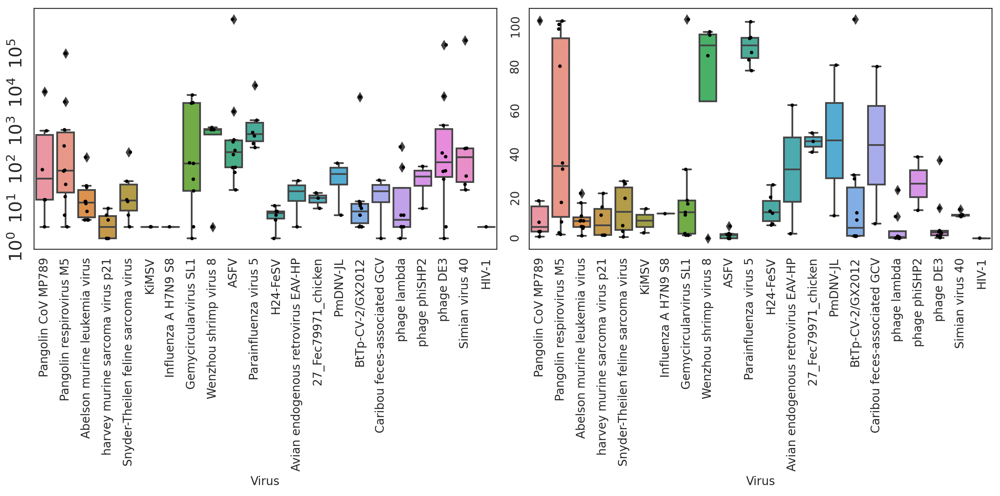

In [891]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,6), dpi= 200)
sns.boxplot(data=df_607174_n, ax=ax1)
sns.set_style("ticks")
sns.stripplot(data=df_607174_n, color='black', size=3, jitter=1, ax=ax1)
ax1.set_xticks(list(range(len(x_codes))))
ax1.set_xticklabels(x_codes,rotation=90)
ax1.set_yticklabels(ax1.get_yticks(), size = 15)
ax1.tick_params(which='major', labelrotation=90)
ax1.set_yscale("log") 

sns.boxplot(data=df_607174_pivot_pct, ax=ax2)
sns.stripplot(data=df_607174_pivot_pct, color='black', size=3, jitter=1, ax=ax2)
ax2.set_xticks(list(range(len(x_codes))))
ax2.set_xticklabels(x_codes,rotation=90)
ax2.tick_params(which='major', labelrotation=90)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA607174_49_viruses_box_plot_N_and_pct_cov_{PARAMS}_10pct_cut.png", bbox_inches='tight')

N and Pct

In [892]:
data_607174=df_607174_pivot.to_numpy()
plot_data = np.ma.masked_equal(data_607174[:,:], 0)

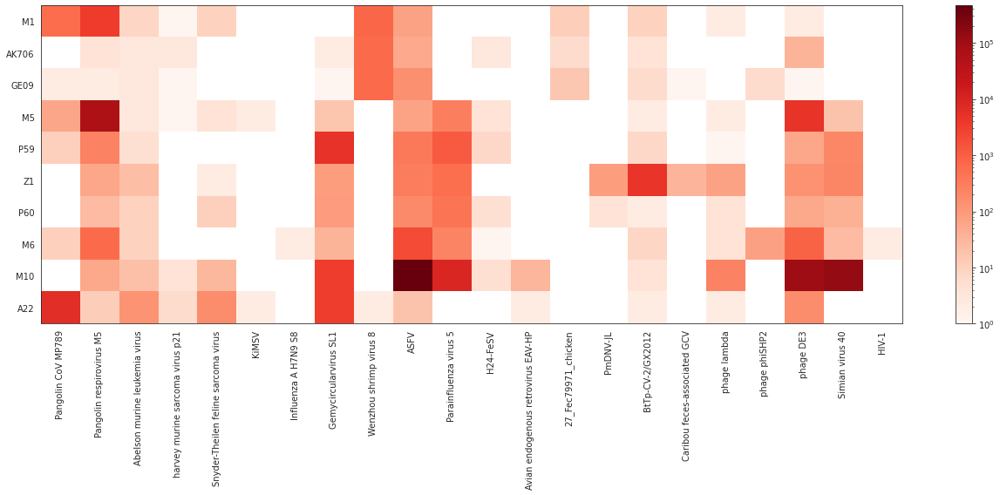

In [893]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,8))
img=ax.imshow(plot_data, cmap=plt.cm.get_cmap("Reds"), interpolation="nearest", aspect='auto',norm=matplotlib.colors.LogNorm())
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA607174_49_viruses_coded_counts_log_scale_{PARAMS}_10pct_cut.png", bbox_inches='tight')

In [894]:
data_cov=df_607174_pivot_pct.to_numpy()
plot_data_cov = np.ma.masked_equal(data_cov[:,:], 0)

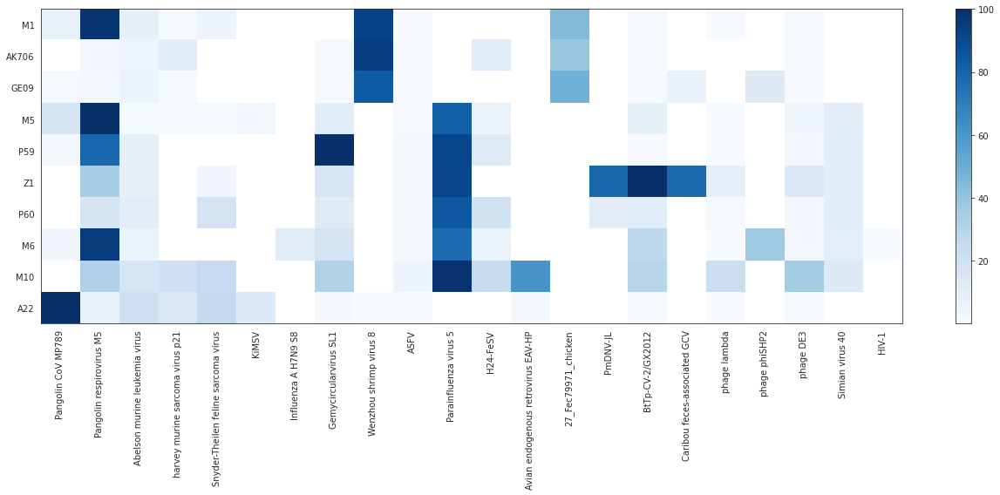

In [895]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,8))
img=ax.imshow(plot_data_cov, cmap=plt.cm.get_cmap("Blues"), interpolation="nearest", aspect='auto')
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA607174_49_viruses_coded_pct_cov_linear_scale_{PARAMS}_10pct_cut.png", bbox_inches='tight')

## PRJNA686836

In [207]:
df_686836=df_all[df_all['BioProject']=='PRJNA686836']

In [208]:
df_686836.head()

,Virus,ref_length,N,DATA(%),Avg depth,Median,Coverage%,Cov 4x %,Cov 10x %,Cov 30x %,Cov 100x %,SRA,BioProject
0,NC_021190.1,46150,13,0.01,0.01,0.0,0.11,0.11,0.11,0.00,0.00,SRR13285085,PRJNA686836
1,NC_029853.1,8183,12648,5.22,77.28,0.0,7.57,4.68,4.24,3.01,2.97,SRR13285085,PRJNA686836
2,NC_038500.1,1998,148,0.06,3.71,0.0,5.86,5.01,2.50,2.50,2.50,SRR13285085,PRJNA686836
3,NC_030141.1,2247,35,0.01,0.78,0.0,5.25,2.23,2.23,2.23,0.00,SRR13285085,PRJNA686836
4,MT121216.1,29521,271,0.11,0.46,0.0,2.69,2.52,2.20,0.34,0.00,SRR13285085,PRJNA686836


Apply 10% cutoff

In [209]:
df_686836_gt_10 = df_686836.loc[df_686836['Coverage%'] >=10]
gt_10_asc=list(set(df_686836_gt_10['Virus'].tolist()))
#add HIV-1 and ASFV
gt_10_asc.append('NC_044948.1')
gt_10_asc.append('NC_001802.1')

In [210]:
df_686836_pivot=df_686836.pivot(index='SRA', columns='Virus', values='N')

In [211]:
#drop ecephalomyocarditis virus

In [213]:
df_686836_pivot.drop('NC_001479.1', axis=1, inplace=True)

In [214]:
#keep only gt_10_asc
#df_686836_pivot=df_686836_pivot[df_686836_pivot.columns[df_686836_pivot.columns.isin(gt_10_asc)]]

In [215]:
order_by=df_accessions['Accession'].tolist()
cols=df_686836_pivot.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [216]:
df_686836_pivot=df_686836_pivot.reindex(columns= reorder_cols)

In [217]:
df_686836_n=df_686836_pivot.copy()

x_labels=list(df_686836_n.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
y_labels=df_686836_n.index.tolist()
y_names=get_samples(y_labels, df_datasets)

### percent box

In [218]:
df_686836_pivot_pct=df_686836.pivot(index='SRA', columns='Virus', values='Coverage%')
df_686836_pivot_pct.drop('NC_001479.1', axis=1, inplace=True)
#keep only gt_10_asc
#df_686836_pivot_pct=df_686836_pivot_pct[df_686836_pivot_pct.columns[df_686836_pivot_pct.columns.isin(gt_10_asc)]]

In [219]:
order_by=df_accessions['Accession'].tolist()
cols=df_686836_pivot_pct.columns.tolist()
reorder_cols=[]
for o in order_by:
    for c in cols:
        if o.strip()==c.strip(): 
            reorder_cols.append(c)
assert len(cols)==len(reorder_cols)

In [220]:
df_686836_pivot_pct=df_686836_pivot_pct.reindex(columns= reorder_cols)

In [221]:
#x_labels=list(df_686836_pivot_pct.columns.values)
#x_codes=get_accessions(x_labels, df_accessions)
#y_labels=df_686836_pivot_pct.index.tolist()
#y_names=get_samples(y_labels, df_datasets)

Side by side plot

/tmp/ipykernel_1456790/187417647.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(ax1.get_yticks(), size = 15)


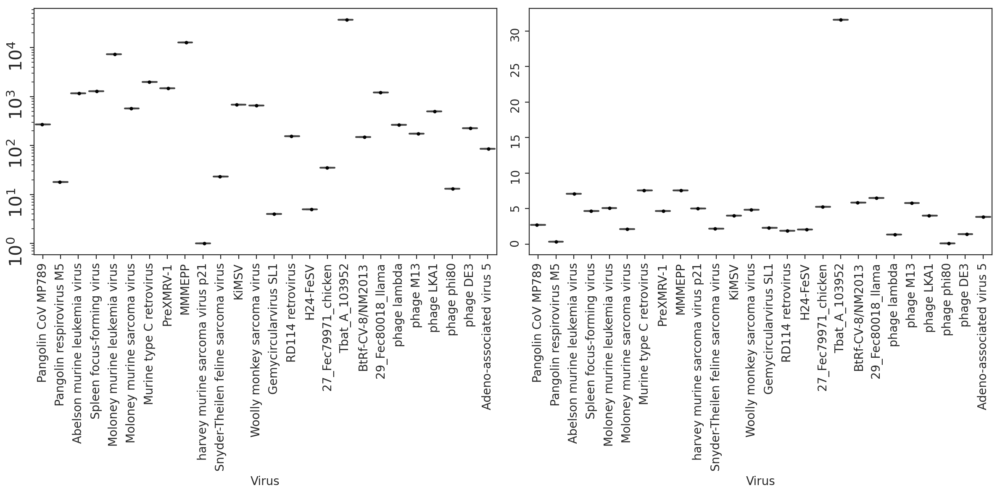

In [222]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,6), dpi= 200)
sns.boxplot(data=df_686836_n, ax=ax1)
sns.set_style("ticks")
sns.stripplot(data=df_686836_n, color='black', size=3, jitter=1, ax=ax1)
ax1.set_xticks(list(range(len(x_codes))))
ax1.set_xticklabels(x_codes,rotation=90)
ax1.set_yticklabels(ax1.get_yticks(), size = 15)
ax1.tick_params(which='major', labelrotation=90)
ax1.set_yscale("log") 

sns.boxplot(data=df_686836_pivot_pct, ax=ax2)
sns.stripplot(data=df_686836_pivot_pct, color='black', size=3, jitter=1, ax=ax2)
ax2.set_xticks(list(range(len(x_codes))))
ax2.set_xticklabels(x_codes,rotation=90)
ax2.tick_params(which='major', labelrotation=90)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA686836_49_viruses_box_plot_N_and_pct_cov_{PARAMS}_10pct.png", bbox_inches='tight')

/tmp/ipykernel_1456790/252758142.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(ax1.get_yticks(), size = 15)


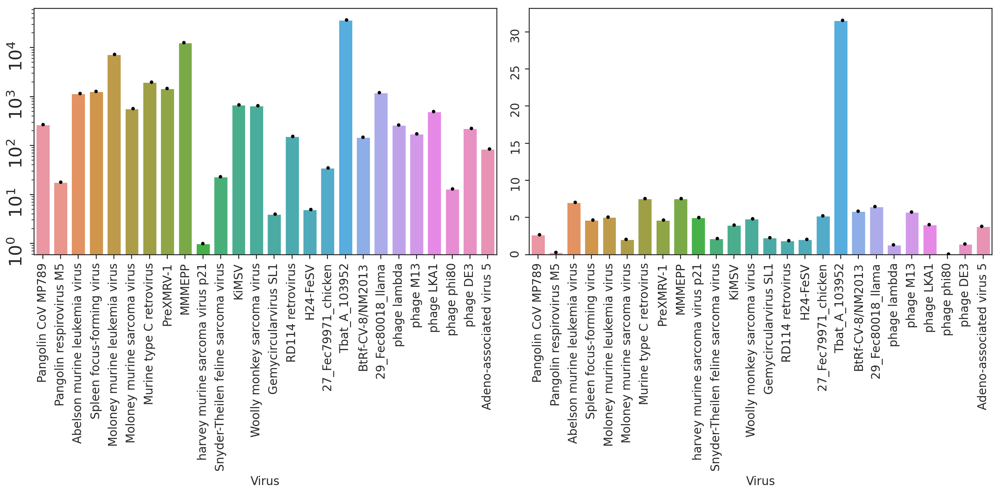

In [224]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,6), dpi= 200)
sns.barplot(data=df_686836_n, ax=ax1)
sns.set_style("ticks")
sns.stripplot(data=df_686836_n, color='black', size=3, jitter=1, ax=ax1)
ax1.set_xticks(list(range(len(x_codes))))
ax1.set_xticklabels(x_codes,rotation=90)
ax1.set_yticklabels(ax1.get_yticks(), size = 15)
ax1.tick_params(which='major', labelrotation=90)
ax1.set_yscale("log") 

sns.barplot(data=df_686836_pivot_pct, ax=ax2)
sns.stripplot(data=df_686836_pivot_pct, color='black', size=3, jitter=1, ax=ax2)
ax2.set_xticks(list(range(len(x_codes))))
ax2.set_xticklabels(x_codes,rotation=90)
ax2.tick_params(which='major', labelrotation=90)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA686836_49_viruses_bar_plot_N_and_pct_cov_{PARAMS}_10pct.png", bbox_inches='tight')

N and Pct

In [845]:
data_686836=df_686836_pivot.to_numpy()
plot_data = np.ma.masked_equal(data_686836[:,:], 0)

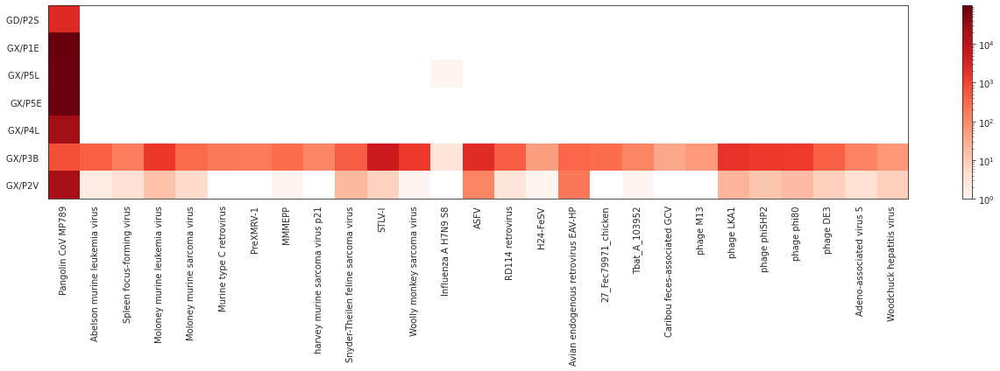

In [846]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,6))
img=ax.imshow(plot_data, cmap=plt.cm.get_cmap("Reds"), interpolation="nearest", aspect='auto',norm=matplotlib.colors.LogNorm())
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA686836_49_viruses_coded_counts_log_scale_{PARAMS}_10pct.png", bbox_inches='tight')

In [847]:
data_cov=df_686836_pivot_pct.to_numpy()
plot_data_cov = np.ma.masked_equal(data_cov[:,:], 0)

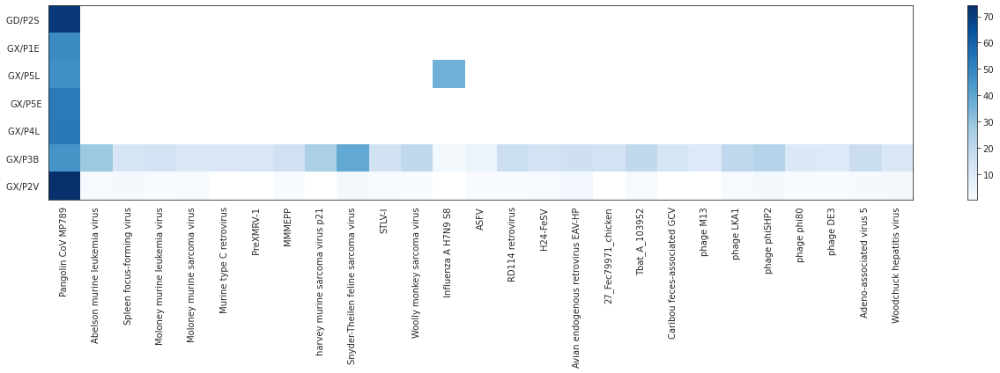

In [848]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(18,6))
img=ax.imshow(plot_data_cov, cmap=plt.cm.get_cmap("Blues"), interpolation="nearest", aspect='auto')
ax.set_xticks(list(range(len(x_codes))))
ax.set_xticklabels(x_codes,rotation=90)
ax.set_yticks(list(range(len(y_names))))
ax.set_yticklabels(y_names)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"PRJNA686836_49_viruses_coded_pct_cov_linear_scale_{PARAMS}_10pct.png", bbox_inches='tight')

## Mitochondrion

In [408]:
df_mito=pd.read_csv(BASE_PATH+'PRJNA573298/general_plots/All_mitochondrial_alignments_N.csv')

In [409]:
df_mito.drop('BioProject', axis=1, inplace=True)
df_mito.drop('SRA', axis=1, inplace=True)

In [410]:
df_mito=df_mito.set_index('Sample')

In [411]:
df_mito.rename(columns={'KY018919.1':'Mus musculus','MG196309.1':'Manis javanica','MK089295.1':'Rhinolophus f.','MK251046.1':'Sus scrofa','MT335859.1':'Manis pentadactyla','NC_009626.1':'Penaeus vannamei','NC_010642.1':'Panthera tigris','NC_012920.1':'Homo sapiens'}, inplace=True)

In [412]:
df_mito.columns=['Mm','Mj','Rf','Ss','Mp','Pv','Pt','Hs']

In [413]:
x_codes=list(df_mito.columns.values)
y_names=df_mito.index.tolist()


In [414]:
df_mito.head()

,Mm,Mj,Rf,Ss,Mp,Pv,Pt,Hs
Sample,,,,,,,,
Lung13,7,1354262,0,NaN,2741,NaN,0.0,91
Lung12,0,16567,0,NaN,7,NaN,0.0,213
Lung11,0,292504,1,NaN,185,NaN,581.0,9
Lung09,0,6276,0,NaN,2,NaN,1553.0,28
Lung08,120,3482,0,NaN,0,NaN,0.0,590


In [415]:
df_mito_n=df_mito.to_numpy()
plot_data = np.ma.masked_equal(df_mito_n[:,:], 0)

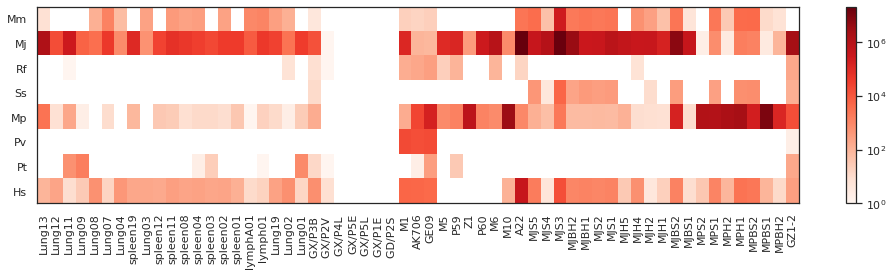

In [417]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(14,4))
img=ax.imshow(plot_data.T, cmap=plt.cm.get_cmap("Reds"), interpolation="nearest", aspect='auto',norm=matplotlib.colors.LogNorm())
ax.set_xticks(list(range(len(y_names))))
ax.set_xticklabels(y_names,rotation=90)
ax.set_yticks(list(range(len(x_codes))))
ax.set_yticklabels(x_codes)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"All_mitochondrio_counts_log_scale_flipped_{PARAMS}.png", bbox_inches='tight')

In [425]:

res=df_mito.div(df_mito.sum(axis=1), axis=0).mul(100).round(3)

In [426]:
res_n=res.to_numpy()
pct_data = np.ma.masked_equal(res_n[:,:], 0)

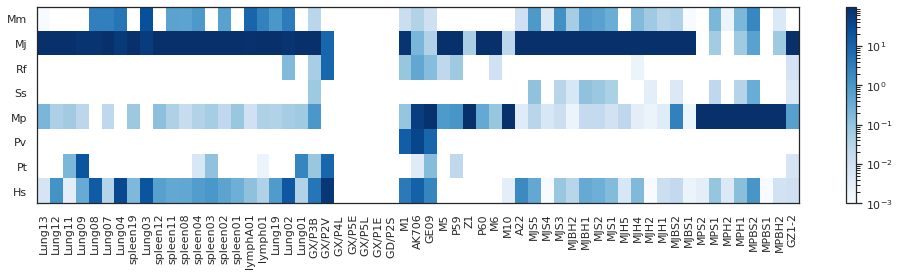

In [435]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(14,4))
img=ax.imshow(pct_data.T, cmap=plt.cm.get_cmap("Blues"), interpolation="nearest", aspect='auto',norm=matplotlib.colors.LogNorm())
ax.set_xticks(list(range(len(y_names))))
ax.set_xticklabels(y_names,rotation=90)
ax.set_yticks(list(range(len(x_codes))))
ax.set_yticklabels(x_codes)
fig.colorbar(img)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"All_mitochondrio_pct_log_scale_flipped_{PARAMS}.png", bbox_inches='tight')

### Bacteria

In [334]:
df_bac=pd.read_csv(BASE_PATH+'PRJNA573298/general_plots/All_Bacteria_STAT_pct.csv')

In [335]:
df_bac.head()

,BioProject,SRA,Bacteria
0,PRJNA573298,SRR10168373,7.6
1,PRJNA573298,SRR10168374,0.9
2,PRJNA573298,SRR10168375,22.0
3,PRJNA573298,SRR10168376,21.0
4,PRJNA573298,SRR10168377,13.0


In [336]:
df_bac.drop('BioProject', axis=1, inplace=True)

In [337]:
#df_bac=df_bac.set_index('SRA')

In [338]:
x_codes=df_bac.SRA.tolist()
y_vals=df_bac.Bacteria.tolist()
y_vals=np.array(y_vals)

In [339]:
x_samples=get_samples(x_codes, df_datasets)

In [340]:
df_bac['Samples']=x_samples

/tmp/ipykernel_1456790/4233257947.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), size = 15)


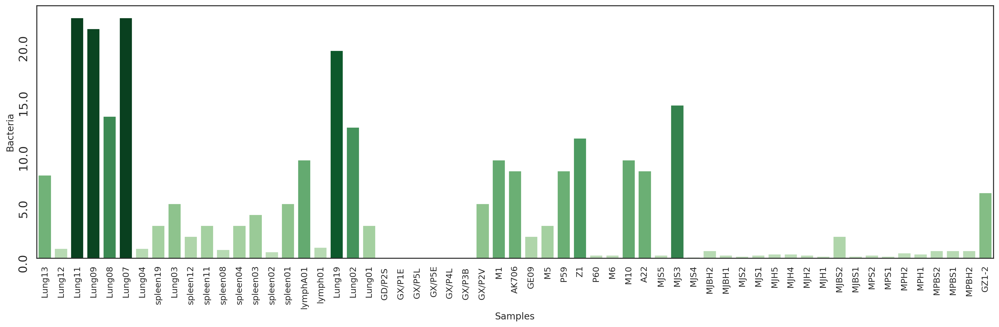

In [352]:
fig, ax = plt.subplots(figsize=(18,6), dpi= 200)
rank = [int((max(y_vals)-elem)*len(y_vals)*0.75/(max(y_vals)+1)) for elem in y_vals] 
pal = sns.color_palette("Greens",len(y_vals))

sns.barplot(x="Samples", y="Bacteria", data=df_bac, palette=np.array(pal[::-1])[rank])
sns.set_style("ticks")
ax.set_xticks(list(range(len(x_samples))))
ax.set_xticklabels(x_samples,rotation=90)
ax.set_yticklabels(ax.get_yticks(), size = 15)
ax.tick_params(which='major', labelrotation=90)
plt.tight_layout()
fig.savefig(PLOT_PATH+f"All_bacteria_pct_{PARAMS}.png", bbox_inches='tight')

### PRJNA573298 Bac+MP789+mito

In [663]:
df_573298=df_all[df_all['BioProject']=='PRJNA573298']

In [664]:
df_573298_pivot=df_573298.pivot(index='SRA', columns='Virus', values='N')

In [665]:
df_573298_789=df_573298_pivot[['MT121216.1']]

In [666]:
df_mito=pd.read_csv(BASE_PATH+'PRJNA573298/general_plots/All_mitochondrial_alignments_N.csv')

In [667]:
#df_mito.drop('BioProject', axis=1, inplace=True)
df_573298_mito=df_mito[df_mito['BioProject']=='PRJNA573298']

In [668]:
df_bac=pd.read_csv(BASE_PATH+'PRJNA573298/general_plots/All_Bacteria_STAT_pct.csv')
df_573298_bac=df_bac[df_bac['BioProject']=='PRJNA573298']

In [669]:
df_573298_mito=df_573298_mito.set_index('SRA')
df_573298_mito.drop('BioProject', axis=1, inplace=True)
df_573298_bac=df_573298_bac.set_index('SRA')
df_573298_bac.drop('BioProject', axis=1, inplace=True)

In [670]:
sras=df_573298_mito.index.values.tolist()
samples=df_573298_mito['Sample'].tolist()

In [671]:
ndf_789 = pd.concat([df_573298_789, df_573298_mito, df_573298_bac], axis=1)

In [672]:
ndf_789=ndf_789[['MT121216.1','KY018919.1','NC_012920.1','Bacteria']]

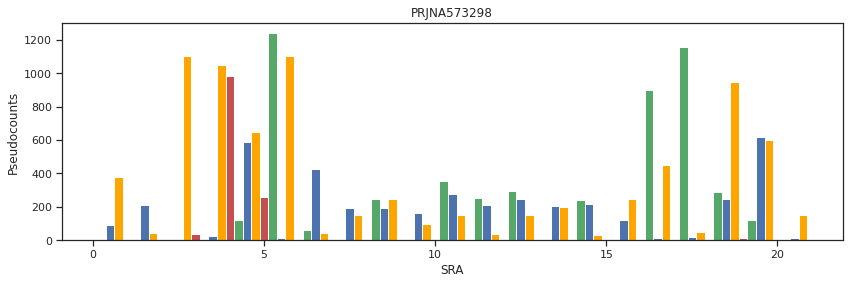

In [673]:

ind = np.arange(len(ndf_789['MT121216.1'].tolist())) 
width = 0.25
  
xvals = ndf_789['MT121216.1'].tolist()
bar1 = plt.bar(ind, xvals, width, color = 'r')
  
yvals = ndf_789['KY018919.1'].tolist()
bar2 = plt.bar(ind+width, yvals, width, color='g')
  
zvals = ndf_789['NC_012920.1'].tolist()
bar3 = plt.bar(ind+width*2, zvals, width, color = 'b')

bvals = ndf_789['Bacteria'].tolist()
bvals = [i * 50 for i in bvals]
bar4 = plt.bar(ind+width*3, bvals, width, color = 'orange')
  
plt.xlabel("SRA")
plt.ylabel('Pseudocounts')
plt.title("PRJNA573298")
  
#plt.xticks(ind+width,['2021Feb01', '2021Feb02', '2021Feb03'])
#plt.legend( (bar1, bar2, bar3), ('Player1', 'Player2', 'Player3') )
plt.show()

## Clustering

In [674]:
plot_data = df_607174_pivot.to_numpy()

NameError: name 'df_607174_pivot' is not defined

In [217]:
plot_data=np.nan_to_num(plot_data)

X=plot_data.copy()

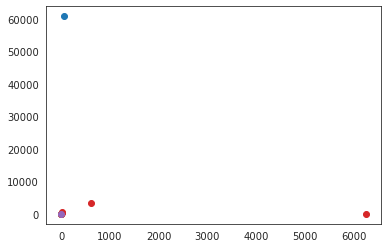

In [218]:
#X, _ = make_classification(n_samples=1000, n_features=2, n_informative=2, n_redundant=0, n_clusters_per_class=1, random_state=4)
# define the model
n_clusters=len(prjs)
model = KMeans(n_clusters=5)
# fit the model
model.fit(X)
# assign a cluster to each example
yhat = model.predict(X)
# retrieve unique clusters
clusters = unique(yhat)
# create scatter plot for samples from each cluster
for cluster in clusters:
	# get row indexes for samples with this cluster
	row_ix = where(yhat == cluster)
	# create scatter of these samples
	plt.scatter(X[row_ix, 0], X[row_ix, 1])
# show the plot
plt.show()

In [219]:
## Scale values

In [220]:
x = scale(X)

In [222]:
pca = PCA(n_components=10)

pca.fit(x)

PCA(n_components=10)

In [223]:
#The amount of variance that each PC explains
var= pca.explained_variance_ratio_

#Cumulative Variance explains
var1=np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100)

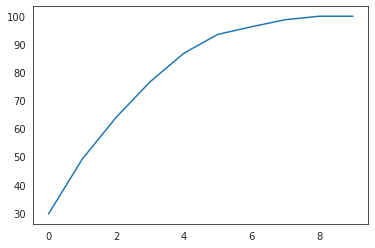

In [224]:
plt.plot(var1)

In [225]:
## PCA plot

In [226]:
pca_2 = PCA(n_components=2)
pcts_2 = pca_2.fit_transform(x)

In [227]:
p2_df = pd.DataFrame(data = pcts_2, columns = ['pc1', 'pc2'])

In [228]:
p2_df.tail()

,pc1,pc2
5,-1.357864,-0.754419
6,-0.985326,-0.601093
7,-2.708341,-2.658974
8,8.818487,-3.800015
9,3.459001,7.086935


In [250]:
df_datasets.head()

,Reference,Institute,BioProject,SRP,Experiment,SRA,Sample,Submitted by,Submitted,Updated,...,Source,Selection,Layout,Spots,Dataset,Machine + flowcell id,Additional machine id,sha256sum,SARS-CoV-2-like Coronavirus Identified and Cited?,Notes
0,Liu et al. 2019,GIABR,PRJNA573298,NaN,SRX6893158,SRR10168373,SAMN12809957,Liu Ping,2019-09-20,NaN,...,GENOMIC,RANDOM,PAIRED,"16,491,648",lung13.1.fq,@A00192:246:HHYMLDSXX:2:2631:28565:19272,NaN,NaN,NaN,NaN
1,Liu et al. 2019,GIABR,PRJNA573298,NaN,SRX6893157,SRR10168374,SAMN12809956,Liu Ping,2019-09-20,NaN,...,NaN,NaN,PAIRED,"9,275,501",lung12.1.fq,@A00192:246:HHYMLDSXX:2:1310:5936:1251,NaN,NaN,Lam et al. 2020,NaN
2,Liu et al. 2019,GIABR,PRJNA573298,SRP223042,SRX6893156,SRR10168375,SAMN12809955,Liu Ping,2019-09-20,2019-09-23,...,NaN,NaN,PAIRED,"22,220,187",lung11.1.fq,@A00192:246:HHYMLDSXX:1:2107:12635:15515,NaN,NaN,Liu et al. 2020; Xiao et al. 2020,NaN
3,Liu et al. 2019,GIABR,PRJNA573298,SRP223042,SRX6893155,SRR10168376,SAMN12809954,Liu Ping,2019-09-20,2019-09-23,...,NaN,NaN,PAIRED,"18,067,615",lung09.1.fq,@A00192:246:HHYMLDSXX:1:2401:25753:6543,NaN,NaN,Liu et al. 2020; Lam et al. 2020,NaN
4,Liu et al. 2019,GIABR,PRJNA573298,SRP223042,SRX6893154,SRR10168377,SAMN12809953,Liu Ping,2019-09-20,2019-09-23,...,NaN,NaN,PAIRED,"16,414,925",lung08.1.fq,@A00184:351:HHYL7DSXX:4:2440:4101:20462,NaN,NaN,"Liu et al. 2020; Lam et al. 2020, Xiao et al. ...",NaN


In [255]:
samples=[]
for s in sras:
    v=df_datasets[df_datasets['SRA']==s]['Name'].values[0]
    samples.append(v)

In [265]:
p2_df['sra']=df_607174_pivot.index.tolist()
p2_df['smple']=samples

In [266]:
print('Explained variation per principal component: {}'.format(pca_2.explained_variance_ratio_))

Explained variation per principal component: [0.29614938 0.19580517]


In [267]:
p2_df.dtypes

pc1       float64
pc2       float64
sra        object
sample     object
smple      object
dtype: object

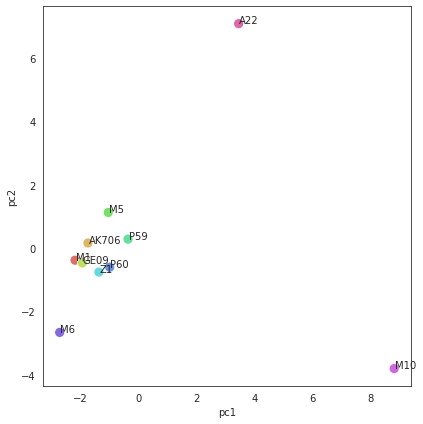

In [269]:
plt.figure(figsize=(6,6))
ax = sns.scatterplot(
    x="pc1", y="pc2",
    hue="sample",
    palette=sns.color_palette("hls", len(df_607174_pivot.index)),
    data=p2_df,
    alpha=0.9,
    legend = False,
    s=100
)
def label_point(x, y, val, ax):
    a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
    for i, point in a.iterrows():
        ax.text(point['x']+.02, point['y'], str(point['val']))

label_point(p2_df.pc1, p2_df.pc2, p2_df.smple, plt.gca())  
plt.tight_layout()
plt.savefig(PLOT_PATH+f"heatmaps_v3_PRJNA607174_viruses_PCA_1-2.png", bbox_inches='tight')

## alt version

In [128]:
y=range(len(p2_df['sra']))
X=plot_data.copy()

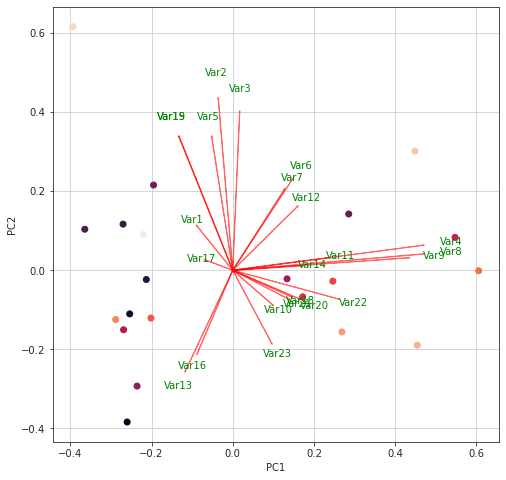

In [129]:
plt.figure(figsize=(8,8))
scaler = StandardScaler()
scaler.fit(X)
X=scaler.transform(X)    

pca = PCA()
x_new = pca.fit_transform(X)

def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley, c = y)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
#plt.xlim(-1,1)
#plt.ylim(-1,1)
plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
plt.grid()

#Call the function. Use only the 2 PCs.
myplot(x_new[:,0:2],np.transpose(pca.components_[0:2, :]))
plt.show()

In [130]:
x_new

array([[-1.64759664e+00, -3.50396957e+00,  1.71356771e+00,
         7.96692858e-01,  2.74469457e+00, -9.66430475e-01,
         8.52070701e-01,  2.24589566e+00, -1.89631997e-01,
        -1.29310725e+00,  1.11603466e+00, -2.08609339e-01,
        -5.52321930e-01, -3.62923691e-02,  7.02725394e-02,
        -3.16031952e-02,  4.33785345e-02,  1.59786864e-02,
        -1.53763853e-03,  5.30037304e-04,  1.70269103e-16],
       [-1.60773421e+00, -1.00695738e+00, -5.55223987e-01,
        -5.06190608e-01, -1.04764178e+00,  5.85258706e-01,
         5.27333545e-01, -7.37837259e-01, -1.49407442e-01,
         3.87535589e-01, -6.25913530e-02, -2.94746615e-01,
        -3.47325719e-01, -2.87864030e-01,  7.36911295e-01,
         3.22286802e-01,  5.98400524e-01,  2.02770673e-02,
        -3.28542987e-02, -8.25876279e-02,  1.70269103e-16],
       [-1.34825408e+00, -2.13633661e-01, -9.21262359e-01,
         9.83944320e-01, -7.28077372e-01, -5.03639276e-02,
         9.12749628e-01, -4.77619023e-01, -1.25358639e

In [131]:
## remove outliers

In [132]:
df_subset=df_pivot.drop(['SRR11093270','SRR11093271','SRR11119767','SRR11306689'])
data_subset=df_subset.to_numpy()
plot_subset = np.ma.masked_equal(data_subset[:,:], 0)
plot_subset=np.nan_to_num(plot_subset)
X_subset=plot_subset.copy()
x_s = scale(X_subset)

In [133]:
pca_2s = PCA(n_components=2)
pc_2s = pca_2s.fit_transform(x_s)
principal_2s = pd.DataFrame(data = pc_2s
             , columns = ['pc1', 'pc2'])
principal_2s['sra']=df_subset.index.tolist()

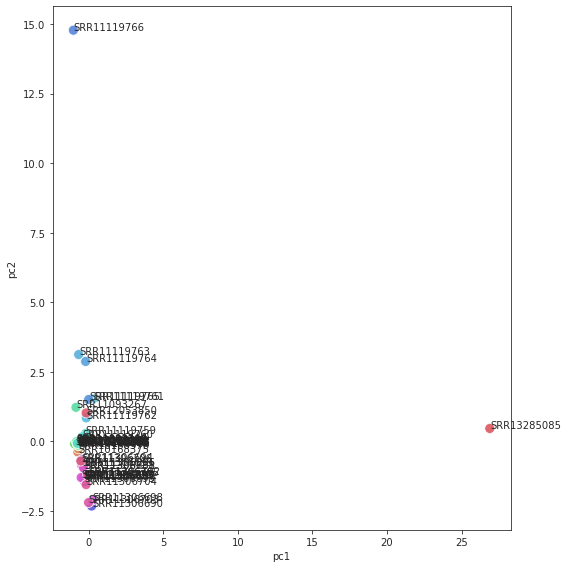

In [134]:
plt.figure(figsize=(8,8))
ax = sns.scatterplot(
    x="pc1", y="pc2",
    hue="sra",
    palette=sns.color_palette("hls", len(df_subset.index)),
    data=principal_2s,
    alpha=0.9,
    legend = False,
    s=100
)
def label_point(x, y, val, ax):
    a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
    for i, point in a.iterrows():
        ax.text(point['x']+.02, point['y'], str(point['val']))

label_point(principal_2s.pc1, principal_2s.pc2, principal_2s.sra, plt.gca())  
#plt.xscale("log")
#plt.yscale("log")
plt.tight_layout()
#fig.savefig(PLOT_PATH+f"Pangolin_SRA_viruses_PCA_1-2_subset.png", bbox_inches='tight')

## PRJNA573298

In [135]:
df_species=pd.read_csv(PLOT_PATH+'PRJNA573298_nt_k141_magicBLAST_species_df.csv')

In [136]:
df_species=df_species.drop(columns=['Unnamed: 0'])

In [137]:
df_mice = df_species[df_species['Name'].str.contains('mouse')]
df_human = df_species[df_species['Name'].str.contains('human')]

In [138]:
del bio_list[amplicons_index]

NameError: name 'bio_list' is not defined

In [ ]:
assert len(df) == len(bio_list)

In [ ]:
df['BioProject']=bio_list

In [ ]:
df_Liu=df[df["BioProject"] == 'PRJNA573298'] 

In [ ]:
assert df_Liu['SRA'].tolist()==df_mice['SRA'].tolist()

In [ ]:
df_Liu=df_Liu.drop(columns=['BioProject','SRA'])

In [ ]:
col_list=df_Liu.columns.values.tolist()

In [ ]:
col_codes=[]
for c in col_list:
    col_codes.append(c.split()[0])
df_Liu.columns=col_codes

In [ ]:
x_labels=list(df_Liu.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
df_Liu.columns=x_codes

In [ ]:
df_Liu['mouse']=df_mice['count'].tolist()
df_Liu['human']=df_human['count'].tolist()

In [ ]:
df_Liu=df_Liu.replace(0,np.nan).dropna(axis=1,how="all")

In [ ]:
sns.set(rc={"figure.figsize":(16, 16)})
sns_plot=sns.heatmap(df_Liu.corr(method='pearson'),annot=True, cmap='coolwarm')
fig = sns_plot.get_figure()
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Liu_2019_viruses_pearson_{ITERATION}.png")

In [ ]:
sns.set(rc={"figure.figsize":(16, 16)})
sns_plot=sns.heatmap(df_Liu.corr(method='spearman'),annot=True, cmap='coolwarm')
fig = sns_plot.get_figure()
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Liu_2019_viruses_spearman_{ITERATION}.png")

## PRJNA607174

In [ ]:
df_species=pd.read_csv(f'{BASE_PATH}PRJNA607174/general_plots/PRJNA607174_nt_k141_magicBLAST_species_df.csv')

In [ ]:
df_species=df_species.drop(columns=['Unnamed: 0'])

In [ ]:
df_mice = df_species[df_species['Name'].str.contains('mouse')]
df_human = df_species[df_species['Name'].str.contains('human')]

In [ ]:
df_Xiao=df[df["BioProject"] == 'PRJNA607174'] 

In [ ]:
df_Xiao=df_Xiao[~df_Xiao.SRA.str.contains("SRR13053879")]

In [ ]:
assert df_Xiao['SRA'].tolist()==df_mice['SRA'].tolist()

In [ ]:
df_Xiao=df_Xiao.drop(columns=['BioProject','SRA'])

In [ ]:
col_list=df_Xiao.columns.values.tolist()

In [ ]:
col_codes=[]
for c in col_list:
    col_codes.append(c.split()[0])
df_Xiao.columns=col_codes

In [ ]:
x_labels=list(df_Xiao.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
df_Xiao.columns=x_codes

In [ ]:
df_Xiao['mouse']=df_mice['count'].tolist()
df_Xiao['human']=df_human['count'].tolist()

In [ ]:
df_Xiao=df_Xiao.replace(0,np.nan).dropna(axis=1,how="all")

In [ ]:
sns.set(rc={"figure.figsize":(16, 16)})
sns_plot=sns.heatmap(df_Xiao.corr(method='pearson'),annot=True, cmap='coolwarm')
fig = sns_plot.get_figure()
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Xiao_2020_viruses_pearson_{ITERATION}.png")

In [ ]:
sns.set(rc={"figure.figsize":(16, 16)})
sns_plot=sns.heatmap(df_Xiao.corr(method='spearman'),annot=True, cmap='coolwarm')
fig = sns_plot.get_figure()
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Xiao_2020_viruses_spearman_{ITERATION}.png")

## PRJNA610466

In [ ]:
df_species=pd.read_csv(f'{BASE_PATH}PRJNA610466/general_plots/PRJNA610466_nt_k141_magicBLAST_species_df.csv')

In [ ]:
df_species=df_species.drop(columns=['Unnamed: 0'])

In [ ]:
df_mice = df_species[df_species['Name'].str.contains('mouse')]
df_human = df_species[df_species['Name'].str.contains('human')]

In [ ]:
df_Li=df[df["BioProject"] == 'PRJNA610466'] 

In [ ]:
df_Li=df_Li[~df_Li.SRA.str.contains("SRR11306687")]

In [ ]:
df_Li=df_Li.reindex([41,40,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58])

In [ ]:
assert df_Li['SRA'].tolist()==df_mice['SRA'].tolist()

In [ ]:
df_Li=df_Li.drop(columns=['BioProject','SRA'])

In [ ]:
col_list=df_Li.columns.values.tolist()

In [ ]:
col_codes=[]
for c in col_list:
    col_codes.append(c.split()[0])
df_Li.columns=col_codes

In [ ]:
x_labels=list(df_Li.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
df_Li.columns=x_codes

In [ ]:
df_Li['mouse']=df_mice['count'].tolist()
df_Li['human']=df_human['count'].tolist()

In [ ]:
df_Li=df_Li.replace(0,np.nan).dropna(axis=1,how="all")

In [ ]:
sns.set(rc={"figure.figsize":(16, 16)})
sns_plot=sns.heatmap(df_Li.corr(method='pearson'),annot=True, cmap='coolwarm')
fig = sns_plot.get_figure()
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Li_2020_viruses_pearson_{ITERATION}.png")

In [ ]:
sns.set(rc={"figure.figsize":(16, 16)})
sns_plot=sns.heatmap(df_Li.corr(method='spearman'),annot=True, cmap='coolwarm')
fig = sns_plot.get_figure()
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Li_2020_viruses_spearman_{ITERATION}.png")

## PRJNA606875

In [ ]:
df_species=pd.read_csv(f'{BASE_PATH}PRJNA606875/general_plots/PRJNA606875_nt_k141_magicBLAST_species_df.csv')

In [ ]:
df_species=df_species.drop(columns=['Unnamed: 0'])

In [ ]:
df_mice = df_species[df_species['Name'].str.contains('mouse')]
df_human = df_species[df_species['Name'].str.contains('human')]

In [ ]:
df_Lam=df[df["BioProject"] == 'PRJNA606875'] 

In [ ]:
assert df_Lam['SRA'].tolist()==df_mice['SRA'].tolist()

In [ ]:
df_Lam=df_Lam.drop(columns=['BioProject','SRA'])

In [ ]:
col_list=df_Lam.columns.values.tolist()

In [ ]:
col_codes=[]
for c in col_list:
    col_codes.append(c.split()[0])
df_Lam.columns=col_codes

In [ ]:
x_labels=list(df_Lam.columns.values)
x_codes=get_accessions(x_labels, df_accessions)
df_Lam.columns=x_codes

In [ ]:
df_Lam['mouse']=df_mice['count'].tolist()
df_Lam['human']=df_human['count'].tolist()

In [ ]:
df_Lam=df_Lam.replace(0,np.nan).dropna(axis=1,how="all")

In [ ]:
sns.set(rc={"figure.figsize":(10, 10)})
sns_plot=sns.heatmap(df_Lam.corr(method='pearson'),annot=True, cmap='coolwarm')
fig = sns_plot.get_figure()
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Lam_2020_viruses_pearson_{ITERATION}.png")

In [ ]:
sns.set(rc={"figure.figsize":(10, 10)})
sns_plot=sns.heatmap(df_Lam.corr(method='spearman'),annot=True, cmap='coolwarm')
fig = sns_plot.get_figure()
plt.tight_layout()
fig.savefig(PLOT_PATH+f"Lam_2020_viruses_spearman_{ITERATION}.png")